# RSAM Plots + Spectrograms + PPSDs
### example with ZE 2303 GPZ

In [1]:
#Working from documentation for Visualizing Probabalistic Power Spectra Densities in the OBSPY 1.4.1 user guide.
#Objective is to determine a strategy for assessing signal quality between different sites and times.
#Signals validated by whatever tool can be produced here are intended to be of enough quality to carry forward for figures and additional analysis

#st = read("https://examples.obspy.org/BW.KW1..EHZ.D.2011.037")
#tr = st.select(id="BW.KW1..EHZ")[0]

import obspy
from obspy import read, UTCDateTime
from obspy.io.xseed import Parser
from obspy.signal import PPSD
import numpy as np
import matplotlib.pyplot as plt
from obspy.imaging.cm import pqlx
import os
from obspy.clients.fdsn import Client
import waveformUtils

In [ ]:
## better version, though still working out tweaks in the download data section, works fine for locally stored data

# define start and end time for the data range
start_date = UTCDateTime(2023, 8, 27)  # Start time
end_date = UTCDateTime(2023, 8, 28)  # End time
delta = 86400  # 1 day in seconds
stas = [2301, 2302, 2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313, 2314, 2315, 2316, 
        'G2301', 'G2302', 'G2303', 'G2304', 'G2305', 'G2306', 'G2307', 'G2308', 'G2309', 'G2310', 'G2311',
        'G2312', 'G2313', 'G2314', 'G2315', 'G2316'] 
stas = ['ZE.2304..GPZ']  # Station IDs

# set station info
nowsta = stas[0]
network, station, location, channel = nowsta.split('.')
print(f"Using station: {nowsta}")

# define path where .mseed files are stored
path = 'C:/Users/zzawol/Documents/seismic-data-iris/seismic_data/NO2304/GPZ'

# check if the path exists, create if not
if not os.path.exists(path):
    print(f"Path '{path}' does not exist. Creating directory...")
    os.makedirs(path, exist_ok=True)
else:
    print(f"Path '{path}' already exists.")

# set up IRIS client
DATASELECT = 'http://service.iris.edu/ph5ws/dataselect/1'
c = fdsn.client.Client(
    service_mappings={
        'dataselect': DATASELECT,
    },
)

# IRIS credentials
username = 'zoe_zawol@partner.nps.gov'
password = 'rJXKed4LZUHUE05g'
c.set_credentials(username, password)

# set up metadata
client = Client("IRISPH5", timeout=600)
#inv = client.get_stations(network='ZE', station=stas[0], level='response')  # Adjust as needed
inv = client.get_stations(network=network, station=station, location=location, channel=channel, level='response') 

# function to get data from IRIS
def get_iris_data(t1, t2, stas, path):
    """Function to get data from IRIS is don't already have"""
    tNow = t1  # start time
    extract_delta = 1800 # 1 day in seconds

    while tNow < t2:
        print(f"Retrieving data from IRIS for {tNow} to {tNow + extract_delta}")
        
        for nowsta in stas:
            print(f"Retrieving data for station {nowsta} from {tNow} to {tNow + extract_delta}")
            
            try:
                #S = c.get_waveforms('ZE', nowsta, '', 'GPZ', tNow, tNow + extract_delta)
                S = c.get_waveforms(network, station, location, channel, tNow, tNow + extract_data) # try adding 1 second to end
                print(f"Data for {nowsta} retrieved successfully.")

                # resample the data
                print('Resampling data...')
                S.resample(350)  # resample to 350 Hz/s
    
                # save the data to .mseed files
                print('Saving data to .mseed files...')
                for tr in S:
                    filename = os.path.join(path, f'{tr.id}_{tr.stats.starttime.strftime("%Y%m%d%H%M%S")}.mseed') # i think this format works for Windows and Macs
                    #filename = '{}/{}_{}.mseed'.format(path, tr.id, tr.stats.starttime.strftime('%Y%m%d%H%M%S'))
                    tr.write(filename)
                    print(f"Saved {filename}")
            except Exception as e:
                print(f"Error retrieving data for {nowsta} from {tNow} to {tNow + extract_delta}: {e}")
        
        tNow += extract_delta  # move to the next day

    print('Data retrieval and saving completed.')  

# function to plot spectrogram
def plot_spectrogram(S, t1, t2):
    """Function to plot a spectrogram."""
    # merge traces to avoid duplicates
    S.merge(method=1)
    #t2 = t2+3600 # add an hour to get full spectra, just may error if whole timeframe is only 1 day instead of multiple days ...
    f1 = waveformUtils.multiDaySpectrogram(S, averageLength=3600, fftLength=60, minFreq=0.5, maxFreq=150, cmap='turbo',
                                           dateLimits=None, vmin=0.4, vmax=0.9, plotAverage=True)
    f1.show()
    plt.show() # won't display each loop without this line
    return f1

# function to plot ppsd and temporal plot
def plot_ppsd(S, inv, t1, t2, user_values):
    """Function to calculate and plot PPSD and Temporal Plot"""
    # merge traces to avoid duplicates
    S.merge(method=1)
    
    # initialize PPSD object
    ppsd = None
    for tr in S:
        if ppsd is None:
            ppsd = PPSD(tr.stats, metadata=inv, period_limits=(1/150, 10.0))
            # this format possibly avoids re-iterating over individual traces/re-creating PPSD object within loop
            #ppsd = PPSD(S[0].stats, metadata=inv, period_limits=(1 / 150, 10.0))  # Adjust period limits

        ppsd.add(tr)
        print('Trace added to PPSD')

    # plot PPSD for the current day
    if ppsd is not None and len(ppsd.times_processed) > 0:
        print(f"Data accumulated for {(t2-t1) / (60 * 60 * 24)}-day periods starting on {t1}")
        ppsd.plot(period_lim=(1/150, 10), cmap=pqlx)
        plt.close()  # close plot after display to prevent it from appearing multiple times
        
        # plot temporal plot if user values are provided
        if user_values:
            print(f"Plotting temporal plot for periods: {user_values}")
            ppsd.plot_temporal(user_values)  # plot the temporal plot with user values
            plt.show()
            plt.close()
        
        # save the plot as .png
        #plot_filename = f"ppsd_plot_{t1.date}.png" # change title if more than one date
        #plt.savefig(plot_filename)
        #print(f"Plot saved as {plot_filename}")

    else:
        print(f"No PPSD data accumulated for {t1} to {t2}")
        
    return ppsd

# temporal plot as its own function
# def plot_temporal(S, user_values, t1, t2):
#     """Function to plot temporal plot based on user-defined periods."""
#     print(f"Plotting temporal plot for periods: {user_values}")
#     # Here, adjust to your specific temporal plotting function as needed
#     S.merge(method=1)
#     ppsd = PPSD(S[0].stats, metadata=inv, period_limits=(1 / 150, 10.0))  # Adjust period limits
#     for tr in S:
#         ppsd.add(tr)
#     ppsd.plot_temporal(user_values)
#     plt.show()

# main function to process data
def process_data(start_date, end_date, stas, path):
    """Function to run through each day of data in timeframe and perform analyses"""
    delta = 86400  # 1 day in seconds
    current_date = start_date
    
    while current_date < end_date:
        t1 = current_date
        t2 = current_date + delta  # the next day
        print(f"\nProcessing data for {t1} to {t2}")

        # check if data exists locally for the current date range
   ###  #file_pattern = f'{path}/ZE.*.*.mseed'  # adjust this based on naming convention
        file_pattern = f'{path}/{network}.{station}.*.{channel}*.mseed' ## if this version, need .split(.) part at top

        try:
            # reading local data for the current date range
            S = obspy.read(file_pattern, starttime=t1, endtime=t2)
            print(f"Found local data for {t1} to {t2}")
        except Exception as e:
            print(f"Error reading local data for {t1} to {t2}: {e}")
            print(f"Fetching data from IRIS for {t1} to {t2}...")
            # fetch data from IRIS if not found locally
            get_data_from_iris(t1, t2, stas, path)
            # once data is saved, reload it for further analysis
            try:
                S = obspy.read(file_pattern, starttime=t1, endtime=t2)
                if not S:
                    print(f"Could not retrieve data for {t1} to {t2}. Skipping.")
                    continue  # skip this day if no data is found
            except Exception as e:
                print(f"Error after fetching from IRIS: {e}")
                continue  # skip to next date if data could not be retrieved

        # merge traces to avoid duplicates
        S.merge(method=1) # maybe delete here? want to merge before ppsd calculation so can just have in functions

        # plot spectrogram
        f1 = plot_spectrogram(S, t1, t2)
        
        # ask user for period values after spectrogram
        print("Enter period values for temporal plot (comma-separated, fractions or decimals):")
        user_inputs = input("Example (0.1, 1, 1/120) : ").split(',')
        
        # process user input - convert fractions and regular floats
        user_values = []
        for value in user_inputs:
            try:
                value = value.strip()  # clean up extra spaces
                if '/' in value:
                    user_values.append(float(Fraction(value))) # handle fraction
                else:
                    user_values.append(float(value)) # handle float
            except ValueError:
                print(f"Invalid input: {value}. Using default values.")
        
        # if user didn't provide any valid values, set defaults
        if not user_values:
            print("No valid input detected. Using default period values.")
            user_values = [0.01, 0.1, 1.0]  # default periods in seconds
        print(user_values) # for checking
        
        # plot PPSD
        plot_ppsd(S, inv, t1, t2, user_values)
        
        # plot temporal plot with user inputted values
        #f2 = plot_temporal(S, user_values, t1, t2)
        # plot both PPSD and temporal plot with user inputted values
        #ppsd = plot_ppsd_and_temporal(S, inv, t1, t2, user_values)
        #ppsd = plot_ppsd(S, inv, t1, t2, user_values)

        # increment the processed days counter (for testing)
        #processed_days += 1
        
        # move to the next day
        current_date += delta

    # return a summary of the processing (for testing)
    #return {"processed_days": processed_days, "errors": errors}

# run the process and get a summary
#summary = process_data(start_date, end_date, stas, path)
#print(f"Processing complete. Processed {summary['processed_days']} days. Errors encountered: {len(summary['errors'])}")

process_data(start_date, end_date, stas, path)

Station: ZE.2303..GPZ

Processing data for 2023-08-11T00:00:00.000000Z to 2023-08-12T00:00:00.000000Z
2023-08-11T23:00:00.000000Z


C:\Users\zzawol\AppData\Local\Temp\1\ipykernel_20476\2451375773.py:57: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  f1.show()


Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-11T00:00:00.000000Z


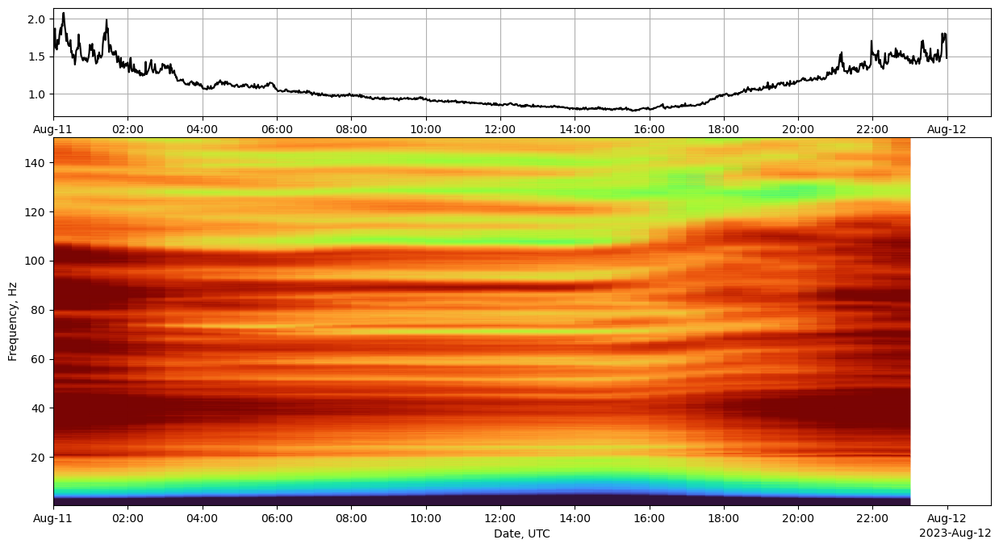

<Figure size 1000x600 with 0 Axes>

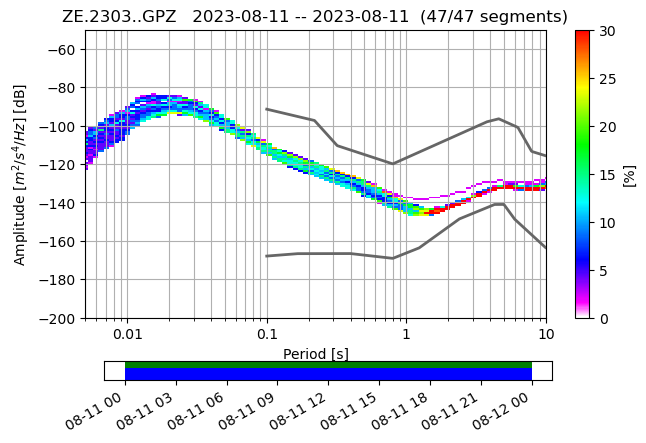

Shape of psd values:  (47, 89)


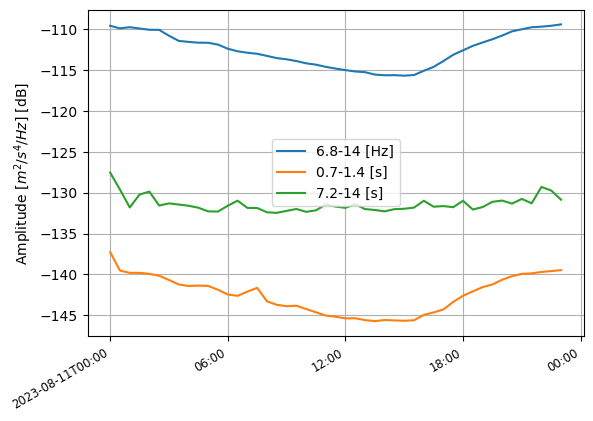


Processing data for 2023-08-12T00:00:00.000000Z to 2023-08-13T00:00:00.000000Z
2023-08-12T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-12T00:00:00.000000Z


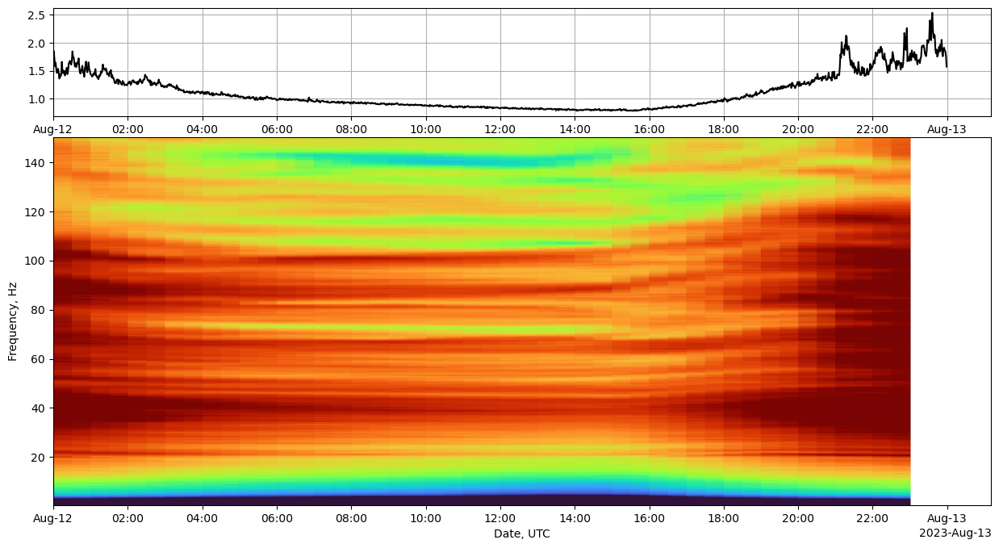

<Figure size 1000x600 with 0 Axes>

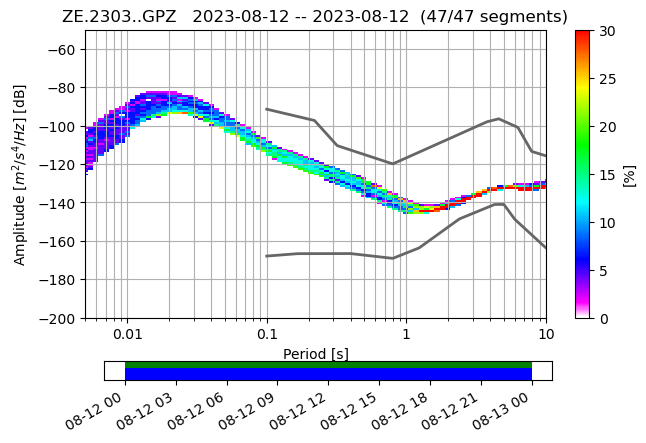

Shape of psd values:  (47, 89)


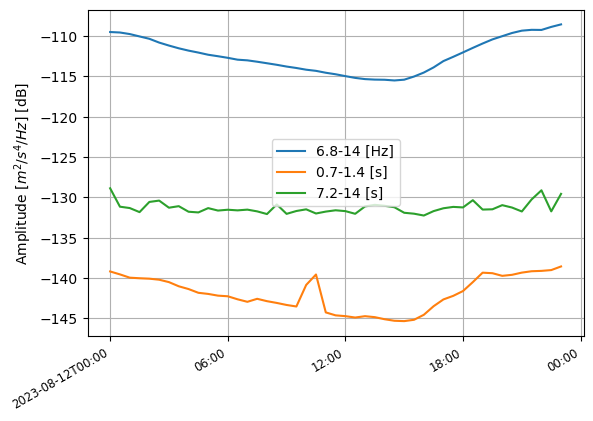


Processing data for 2023-08-13T00:00:00.000000Z to 2023-08-14T00:00:00.000000Z
2023-08-13T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-13T00:00:00.000000Z


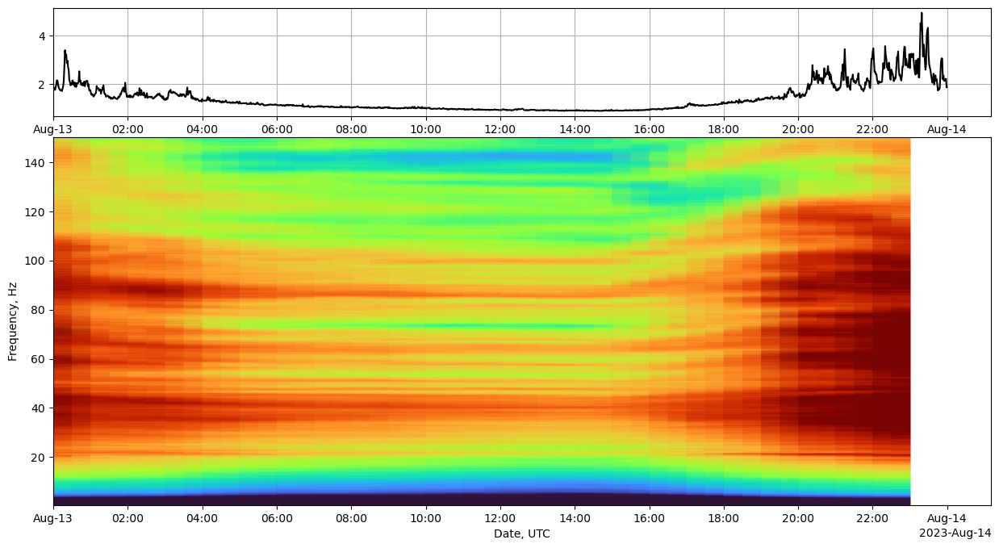

<Figure size 1000x600 with 0 Axes>

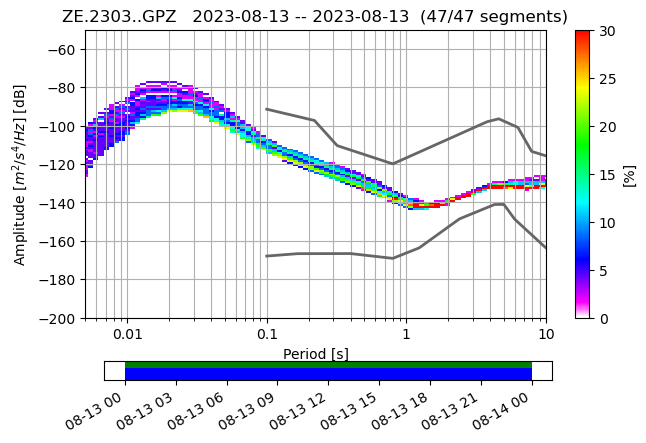

Shape of psd values:  (47, 89)


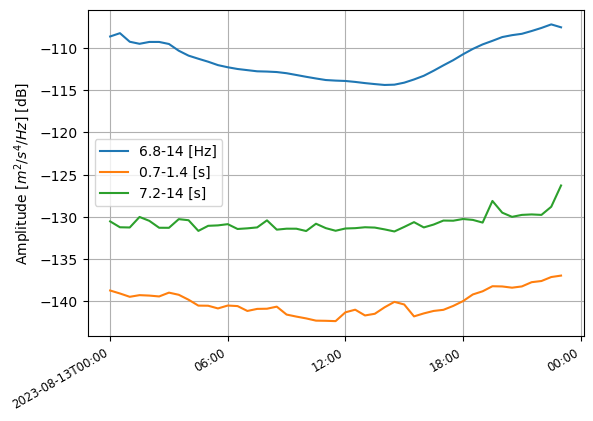


Processing data for 2023-08-14T00:00:00.000000Z to 2023-08-15T00:00:00.000000Z
2023-08-14T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-14T00:00:00.000000Z


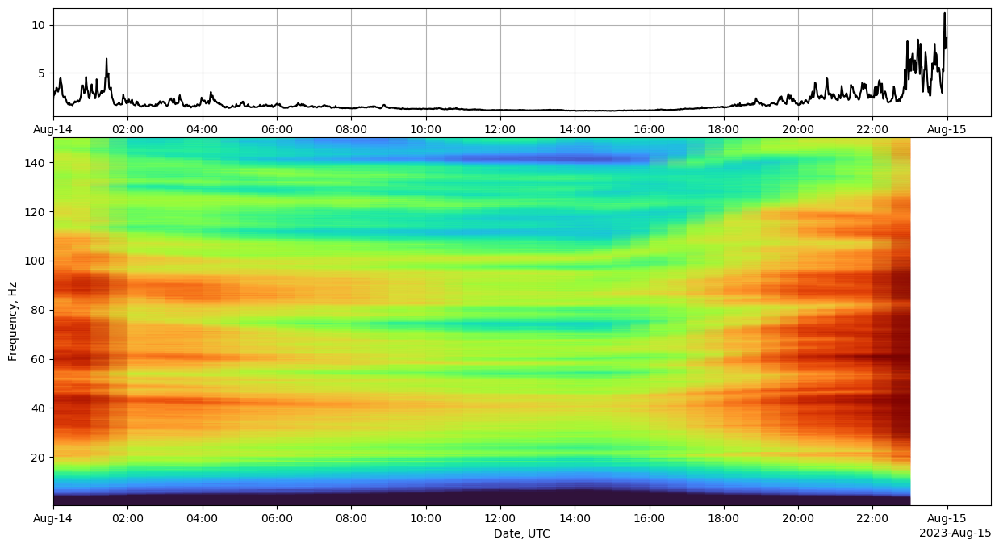

<Figure size 1000x600 with 0 Axes>

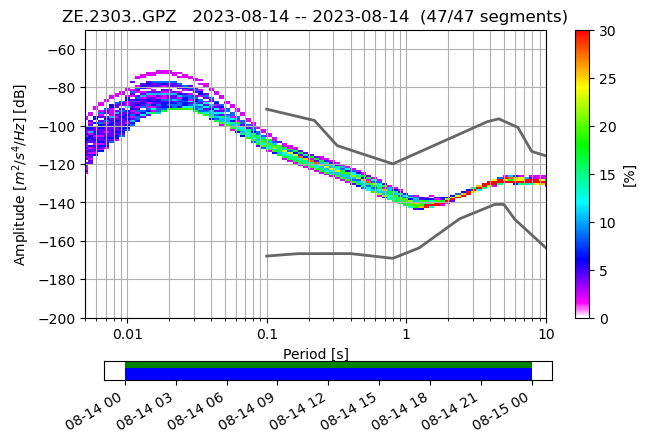

Shape of psd values:  (47, 89)


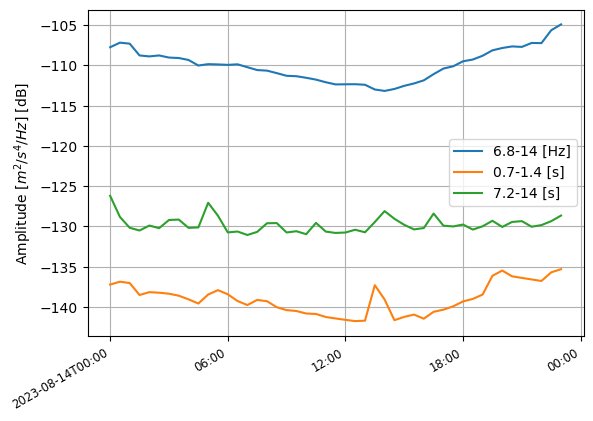


Processing data for 2023-08-15T00:00:00.000000Z to 2023-08-16T00:00:00.000000Z
2023-08-15T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-15T00:00:00.000000Z


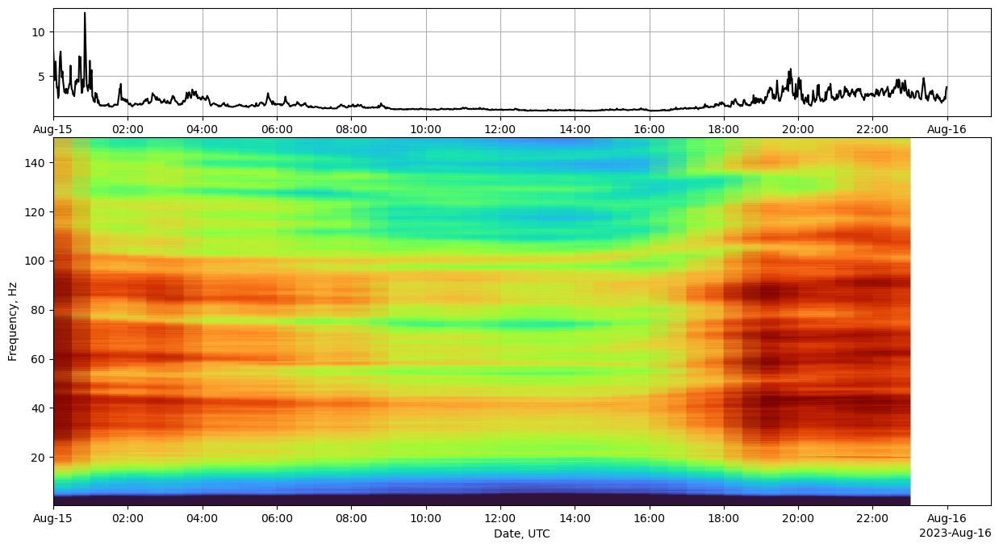

<Figure size 1000x600 with 0 Axes>

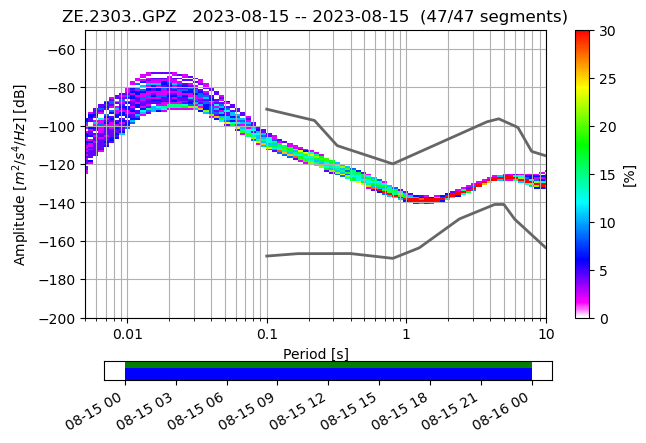

Shape of psd values:  (47, 89)


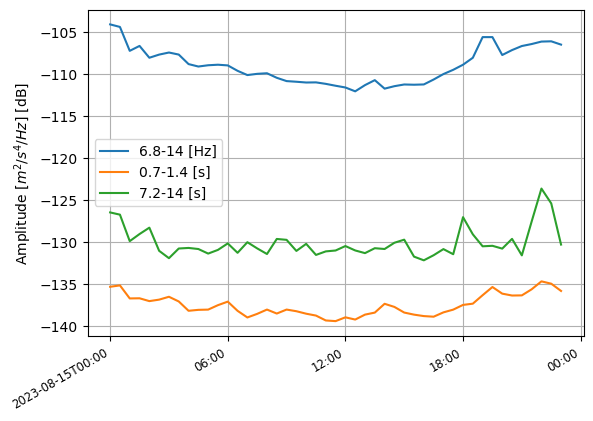


Processing data for 2023-08-16T00:00:00.000000Z to 2023-08-17T00:00:00.000000Z
2023-08-16T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-16T00:00:00.000000Z


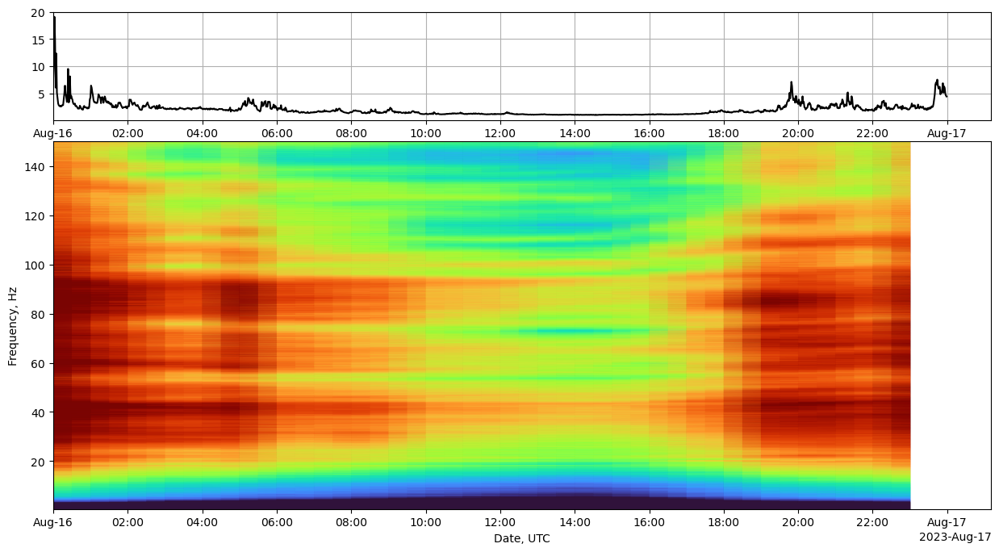

<Figure size 1000x600 with 0 Axes>

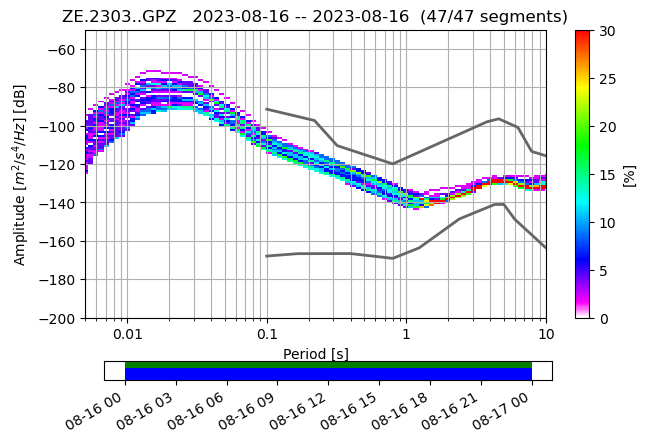

Shape of psd values:  (47, 89)


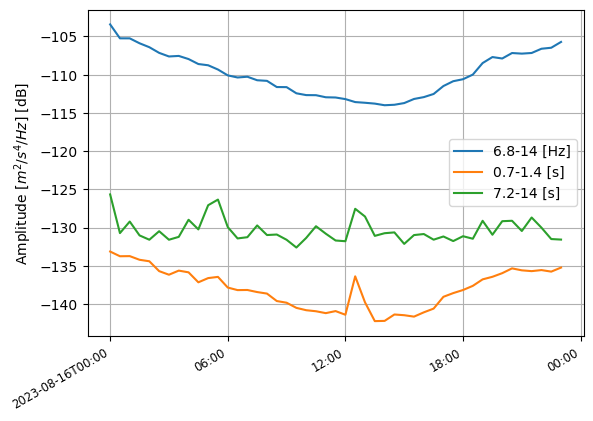


Processing data for 2023-08-17T00:00:00.000000Z to 2023-08-18T00:00:00.000000Z
2023-08-17T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-17T00:00:00.000000Z


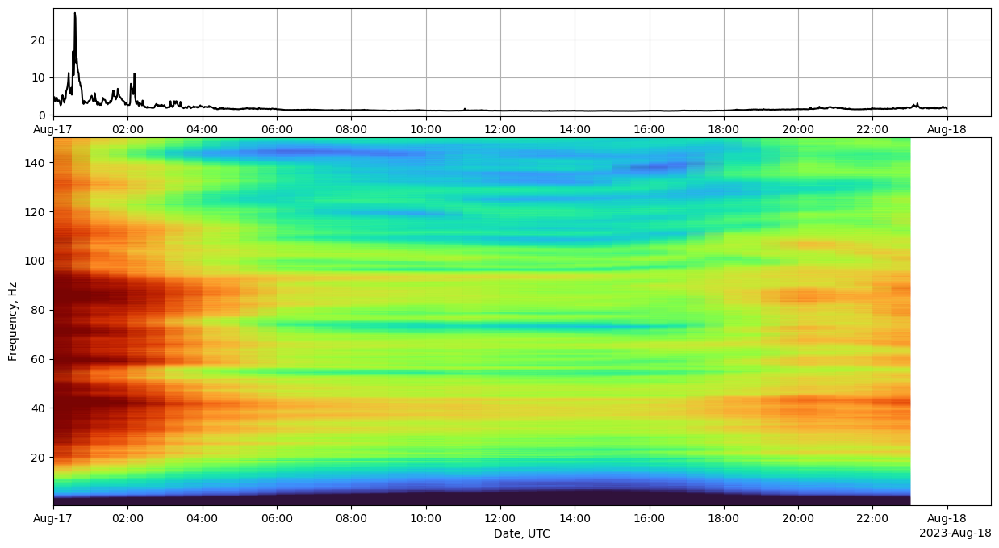

<Figure size 1000x600 with 0 Axes>

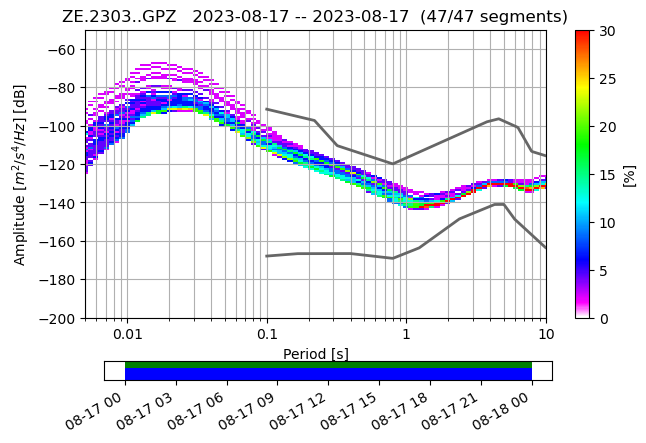

Shape of psd values:  (47, 89)


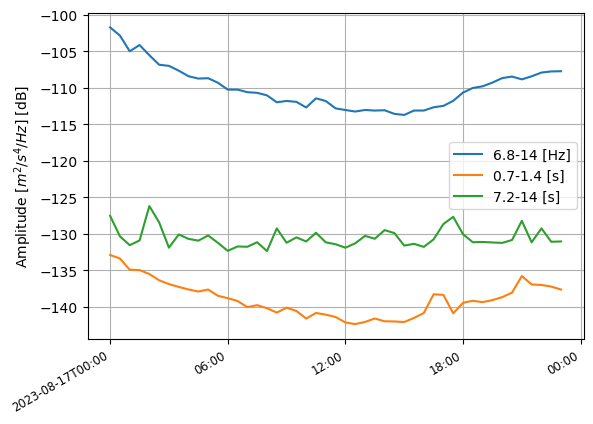


Processing data for 2023-08-18T00:00:00.000000Z to 2023-08-19T00:00:00.000000Z
2023-08-18T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-18T00:00:00.000000Z


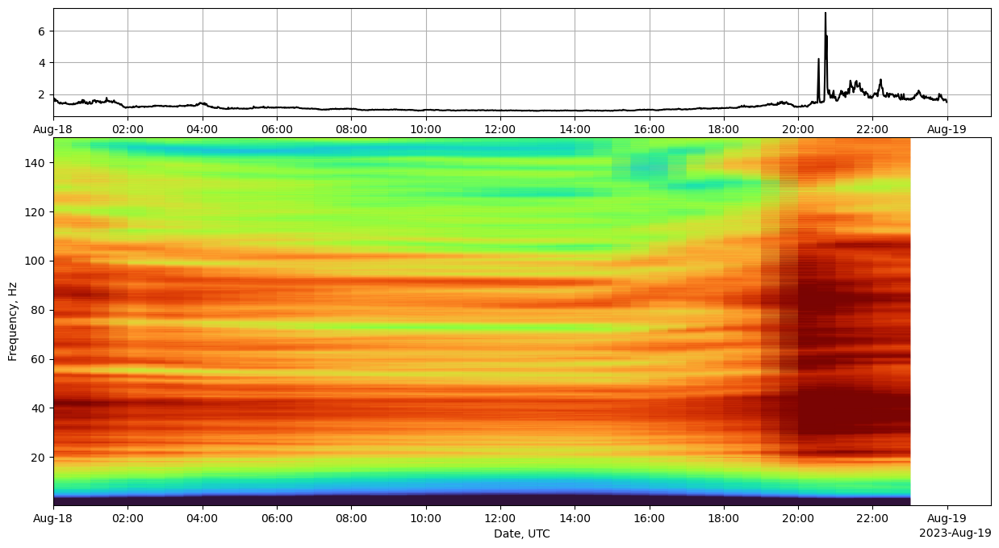

<Figure size 1000x600 with 0 Axes>

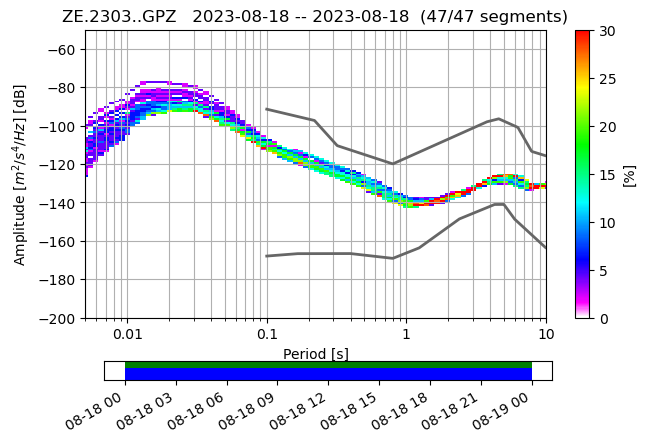

Shape of psd values:  (47, 89)


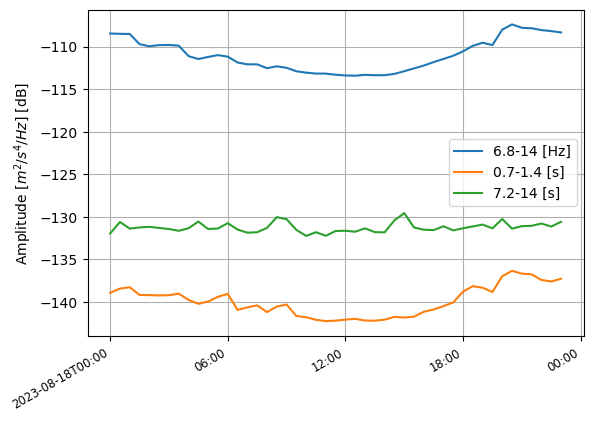


Processing data for 2023-08-19T00:00:00.000000Z to 2023-08-20T00:00:00.000000Z
2023-08-19T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-19T00:00:00.000000Z


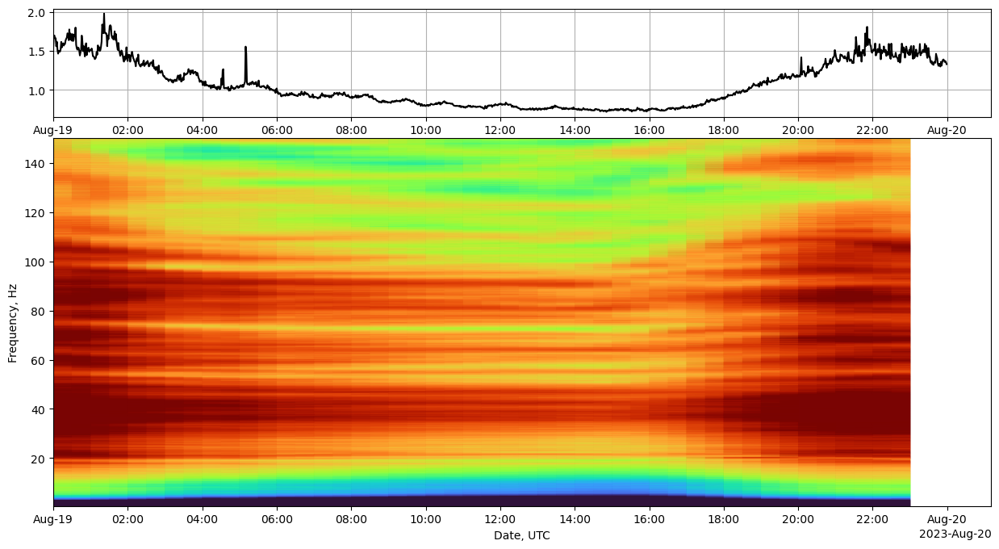

<Figure size 1000x600 with 0 Axes>

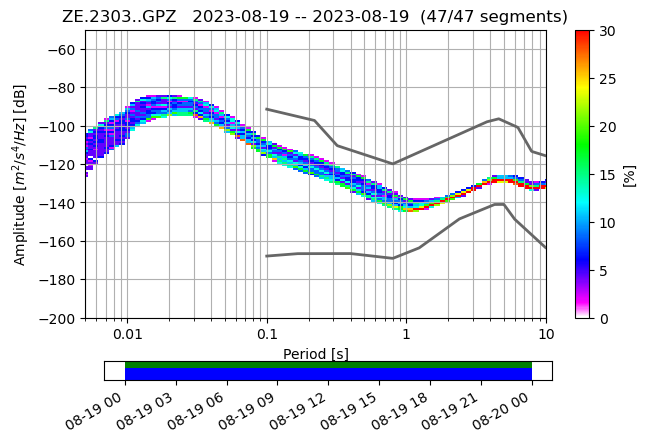

Shape of psd values:  (47, 89)


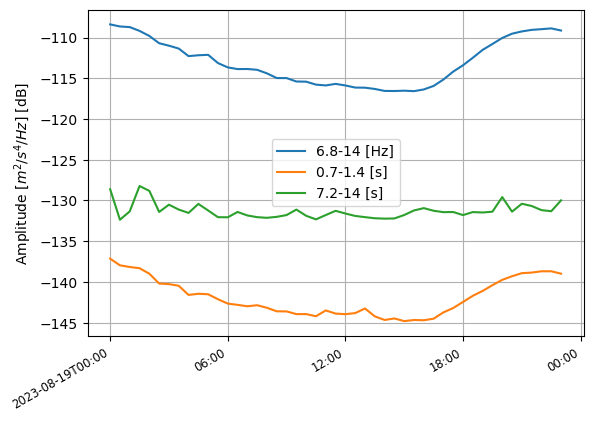


Processing data for 2023-08-20T00:00:00.000000Z to 2023-08-21T00:00:00.000000Z
2023-08-20T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-20T00:00:00.000000Z


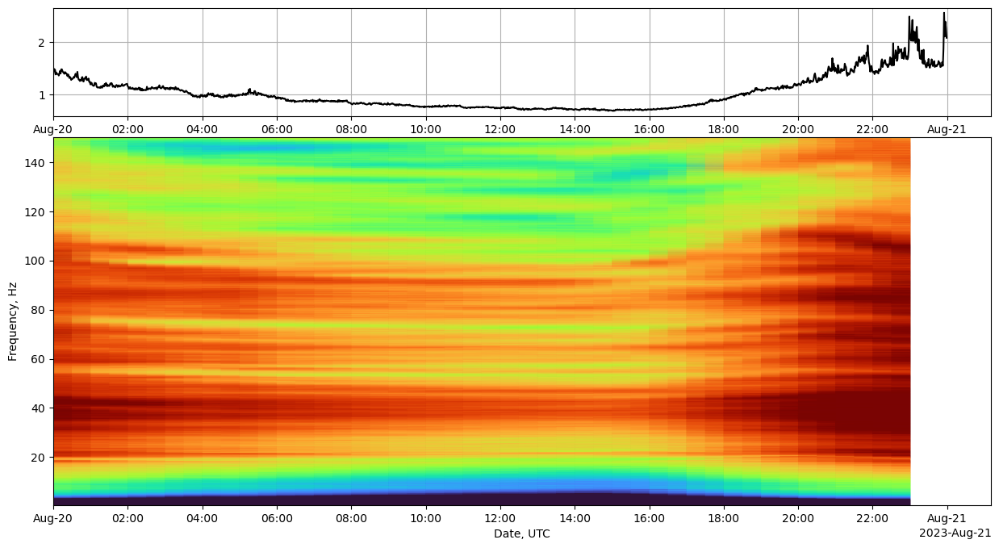

<Figure size 1000x600 with 0 Axes>

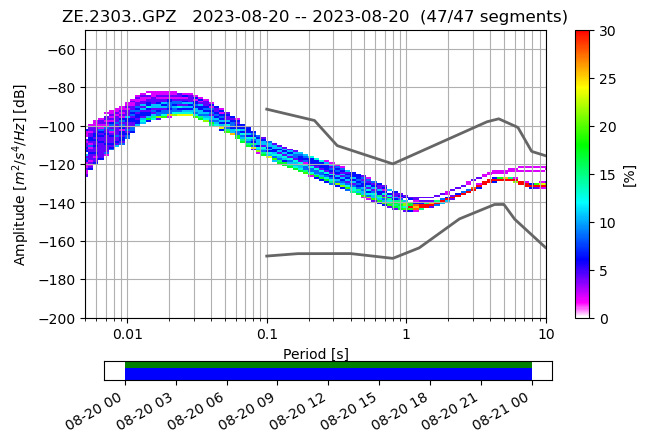

Shape of psd values:  (47, 89)


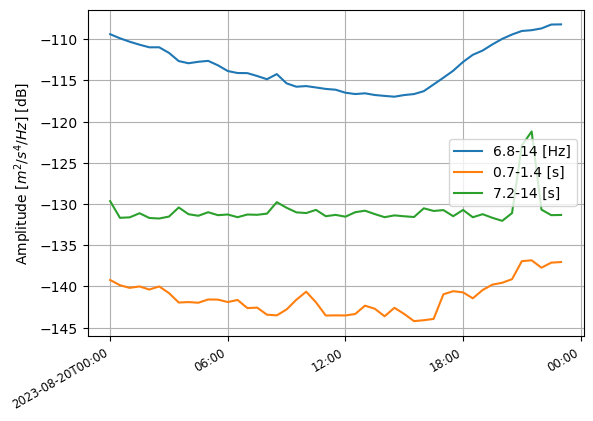


Processing data for 2023-08-21T00:00:00.000000Z to 2023-08-22T00:00:00.000000Z
2023-08-21T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-21T00:00:00.000000Z


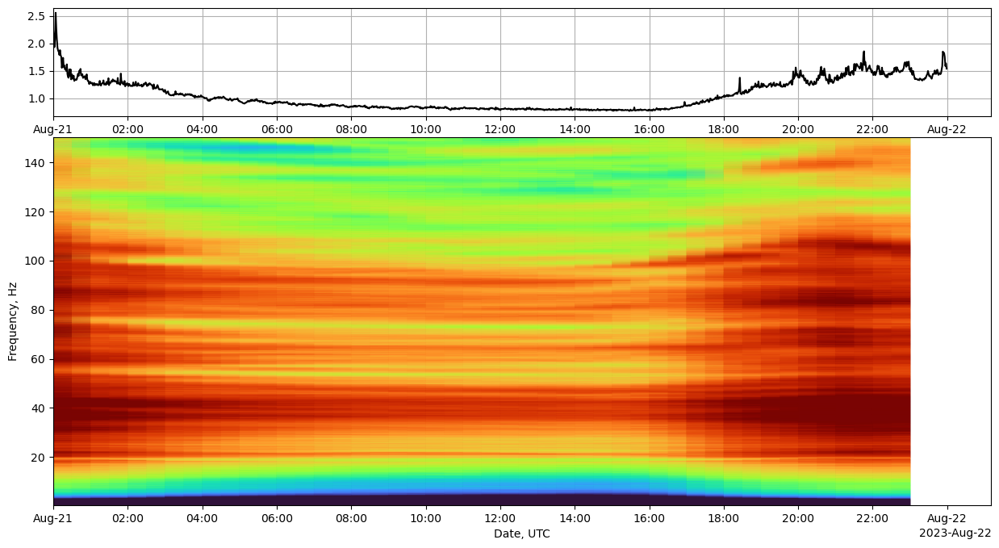

<Figure size 1000x600 with 0 Axes>

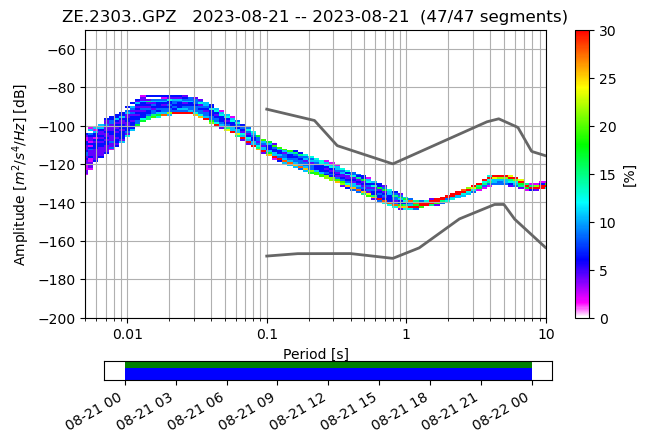

Shape of psd values:  (47, 89)


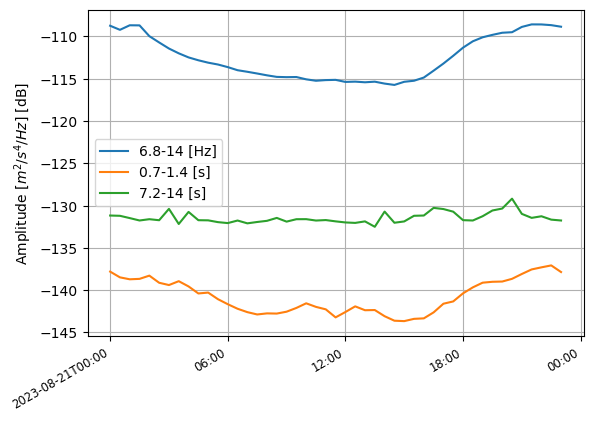


Processing data for 2023-08-22T00:00:00.000000Z to 2023-08-23T00:00:00.000000Z
2023-08-22T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-22T00:00:00.000000Z


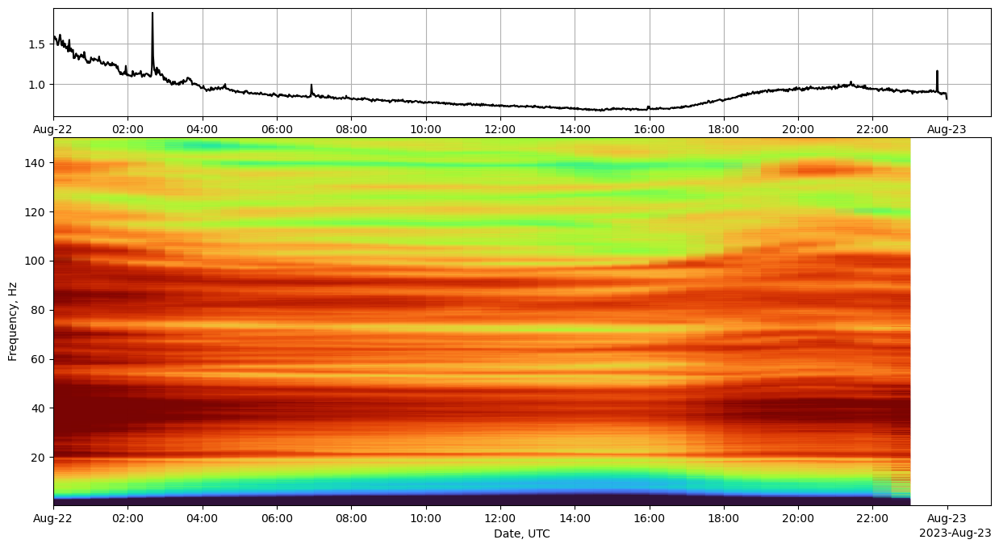

<Figure size 1000x600 with 0 Axes>

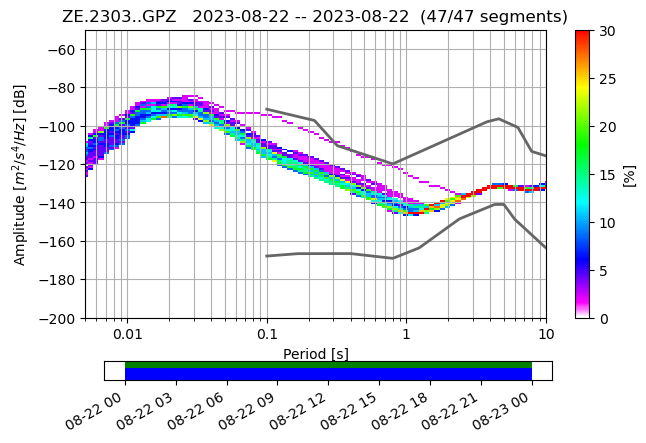

Shape of psd values:  (47, 89)


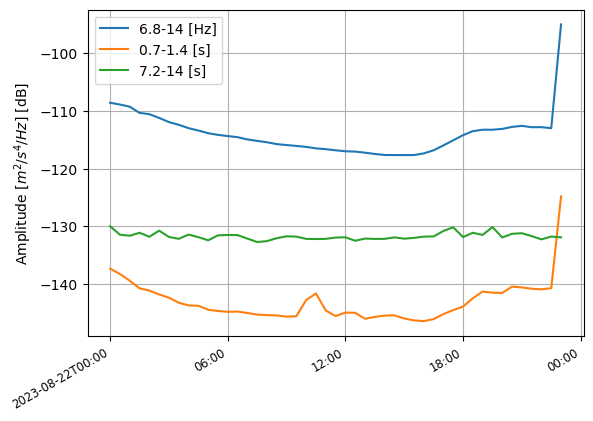


Processing data for 2023-08-23T00:00:00.000000Z to 2023-08-24T00:00:00.000000Z
2023-08-23T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-23T00:00:00.000000Z


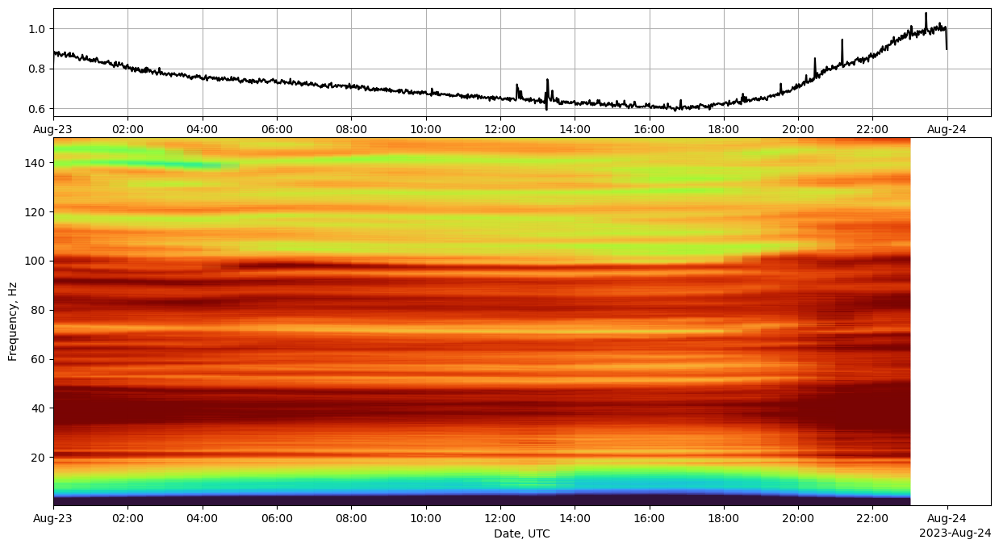

<Figure size 1000x600 with 0 Axes>

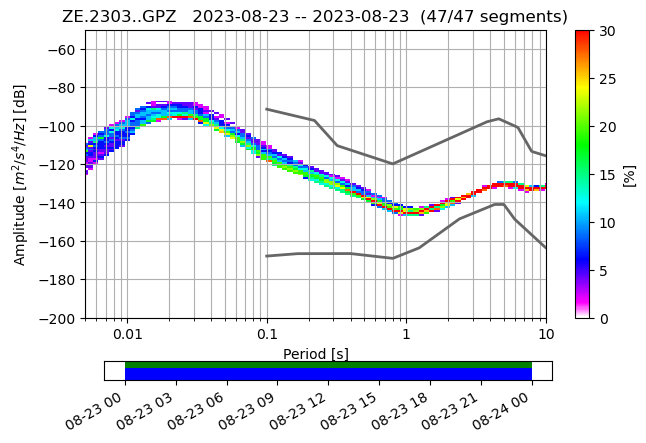

Shape of psd values:  (47, 89)


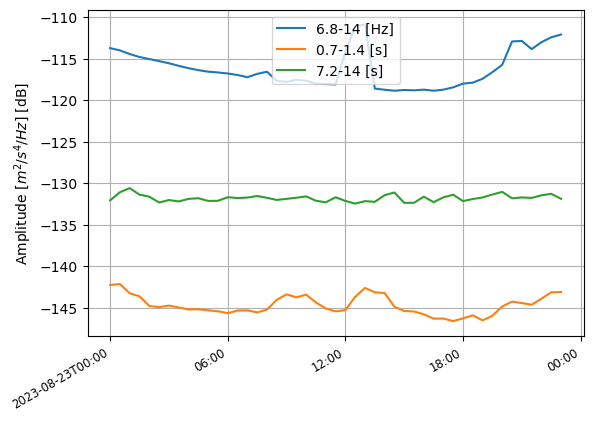


Processing data for 2023-08-24T00:00:00.000000Z to 2023-08-25T00:00:00.000000Z
2023-08-24T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-24T00:00:00.000000Z


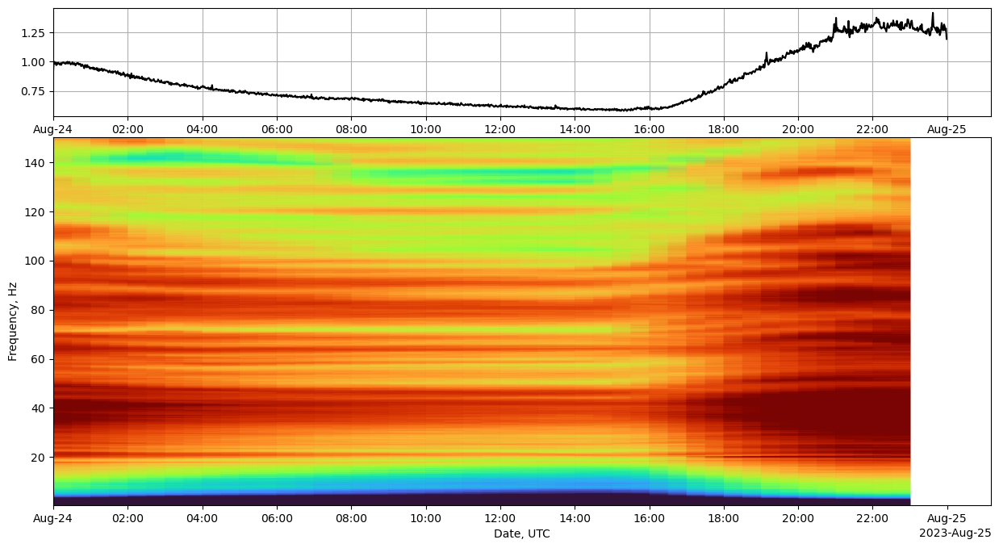

<Figure size 1000x600 with 0 Axes>

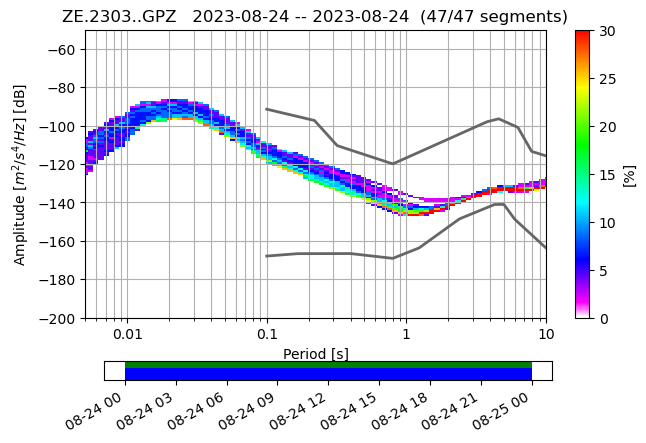

Shape of psd values:  (47, 89)


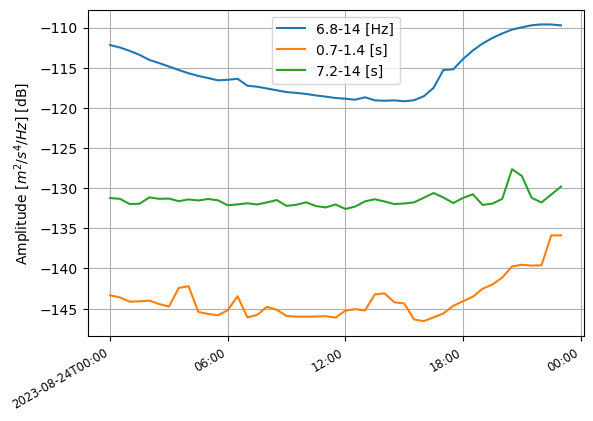


Processing data for 2023-08-25T00:00:00.000000Z to 2023-08-26T00:00:00.000000Z
2023-08-25T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-25T00:00:00.000000Z


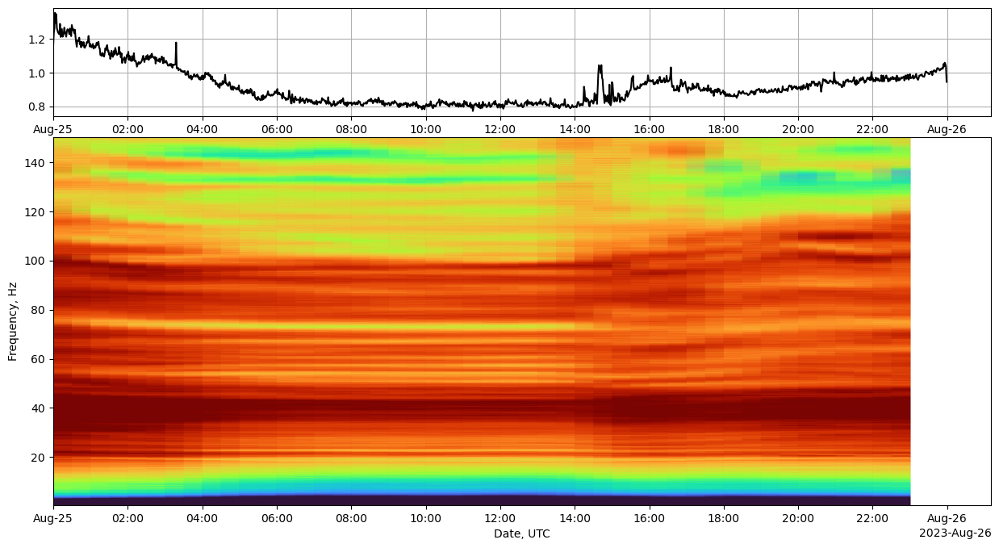

<Figure size 1000x600 with 0 Axes>

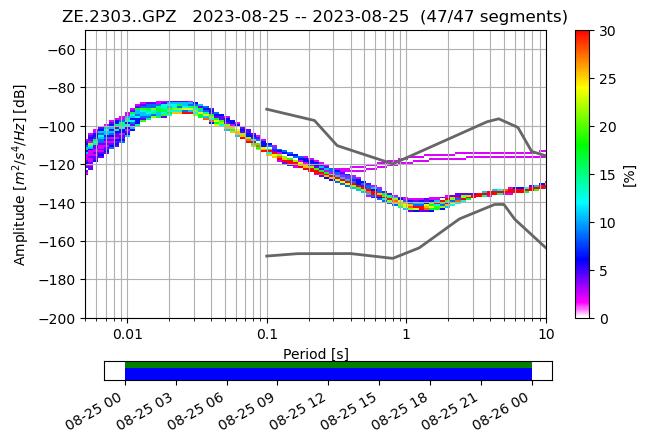

Shape of psd values:  (47, 89)


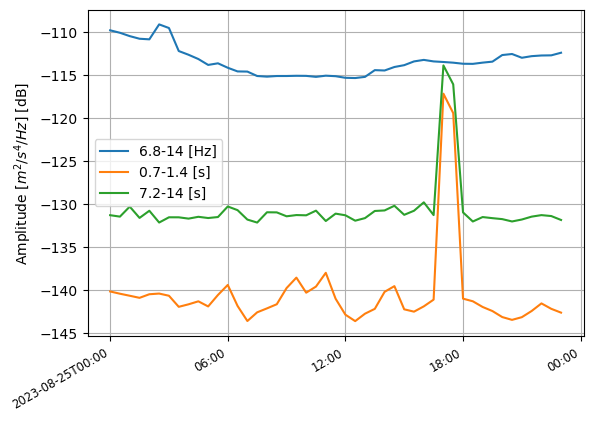

In [5]:
# older version, but contains printed plots for quicker reference, will delete when above is finalized

## this is run for ZE 2303 GPZ 8/11 - 8/26 (15 days)
# takes ~3.5 mins for each set of plots to display

## whole date range for ZE 2302 is 2023-08-10 to 2023-09-09
## whole date range for ZE 2303 is 2023-07-12 to 2023-09-08
## whole date range for ZE 2304 is 2023-07-12 to 2023-09-07
# exclude first and last day for cleaner data

# define start and end time for the data range
start_date = UTCDateTime(2023, 8, 11)  # Start time
end_date = UTCDateTime(2023, 8, 26)  # End time
delta = 86400
stas = [2301, 2302, 2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313, 2314, 2315, 2316, 
        'G2301', 'G2302', 'G2303', 'G2304', 'G2305', 'G2306', 'G2307', 'G2308', 'G2309', 'G2310', 'G2311',
        'G2312', 'G2313', 'G2314', 'G2315', 'G2316'] 

# define path where .mseed files are stored
path = 'C:/Users/zzawol/Documents/seismic-data-iris/seismic_data/NO2303/GPZ'
stas = ['ZE.2303..GPZ']  # station IDs
if not os.path.exists(path):
    os.makedirs(path, exist_ok=True)

# set station info
nowsta = stas[0]
network, station, location, channel = nowsta.split('.')
print(f"Station: {nowsta}")

# define the file pattern for reading mseed files
# assuming filenames follow the pattern 'ZE.2304..GPZ_YYYYMMDDTHHMMSS.mseed'
file_pattern = f'{path}/{network}.{station}.*.{channel}*.mseed'

# set up metadata
client = Client("IRISPH5", timeout=600) # timeout (s) - time before connection timeout is raised, default 10s
inv = client.get_stations(network=network, station=station, location=location, channel=channel, level='response')  

# loop through each day in the date range
current_date = start_date
while current_date < end_date:
    t1 = current_date
    t2 = current_date + delta  # the next day
    print(f"\nProcessing data for {t1} to {t2}")

    try: # read data for the current day
        S = obspy.read(file_pattern, starttime=t1, endtime=t2)
        ## RSAM plot before resample?
    except Exception as e:
        print(f"Error reading data for {t1} to {t2}: {e}")
        current_date += delta
        continue  # skip to next date if there's an error reading data

    # merge traces to avoid duplicates
    S.merge(method=1)

    # or plot RSAM after merge, before resample?
    f1 = waveformUtils.multiDaySpectrogram(S, averageLength=3600, fftLength=60, minFreq=0.5, maxFreq=150, cmap='turbo',
                                      dateLimits=None,
                                      vmin=0.4, vmax=0.9, plotAverage=True)
    f1.show()
    
    # resample the data
    print('Resampling...')
    S.resample(300)  # Resampled rate for final analysis. Note: Consider Nyquist criterion

    # or plot RSAM after resample?
    
    # create PPSD object and add traces
    ppsd = None
    for tr in S:
        if ppsd is None:
            ppsd = PPSD(tr.stats, metadata=inv, period_limits=(1/150, 10.0)) # ppsd computed for 0.1 to 200 Hz --> should this be 0.0057s (175 Hz) since new resample rate??
        ppsd.add(tr)
        print('Trace added')

    # plot the PPSD for the current day
    if ppsd is not None and len(ppsd.times_processed) > 0:
        print(f"Data accumulated for {(t2-t1)/(60*60*24)}-day periods starting on {t1}")
        #print("Processed times:", ppsd.times_processed[:10])  # see first 10 times processed
        
        # plot the PPSD
        plt.figure(figsize=(10, 6))
        ppsd.plot(period_lim=(1/150,10),cmap=pqlx) # to zoom into a specific range, adjust period_lim
        psd_values = ppsd.psd_values
        print("Shape of psd values: ", np.shape(psd_values))
        #print(psd_values[0:1]) # first branch

        # add x-axis of PST
        
        # plotting time series of PSD values
        ppsd.plot_temporal([0.1,1,10])
        # use these values instead:
        #ppsd.plot_temporal([0.00667,0.01,0.1]) # period bins (s)
        
        # save the plot as .png
        #plot_filename = f"ppsd_plot_{t1.date}.png" # change title if more than one date
        #plt.savefig(plot_filename)
        #print(f"Plot saved as {plot_filename}")
        
        plt.close()  # close plot to avoid displaying it in each iteration
        
    else:
        print(f"No data accumulated for {t1} to {t2}, check if exists")

    # move to the next day
    current_date += delta



In [6]:
print("the following cells are the same 5 day window of 2302, looking at different frequency bins")

the following cells are the same 5 day window of 2302, looking at different frequency bins


Station: ZE.2302..GPZ

Processing data for 2023-08-12T00:00:00.000000Z to 2023-08-13T00:00:00.000000Z
2023-08-12T23:00:00.000000Z


C:\Users\zzawol\AppData\Local\Temp\1\ipykernel_18184\495376984.py:63: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  f1.show()


Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-12T00:00:00.000000Z


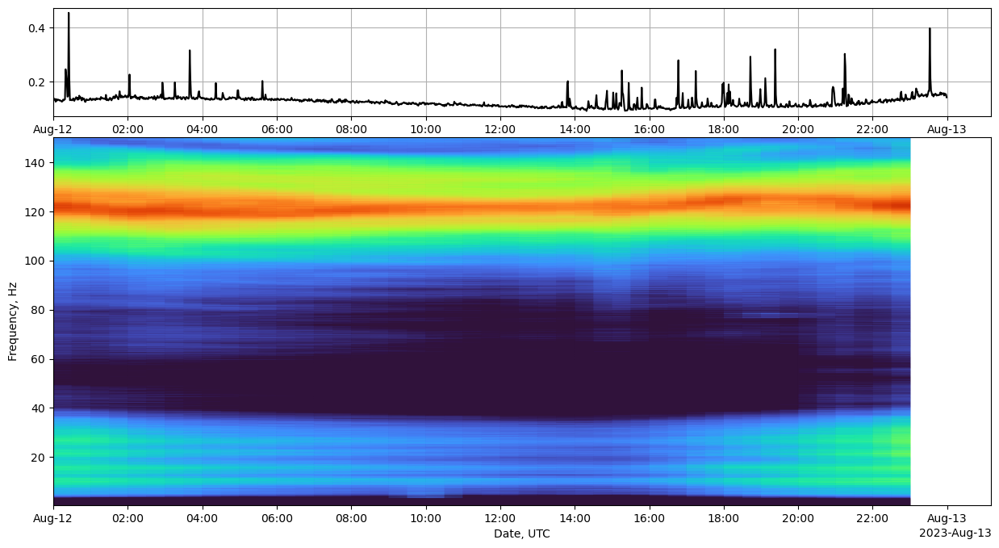

<Figure size 1000x600 with 0 Axes>

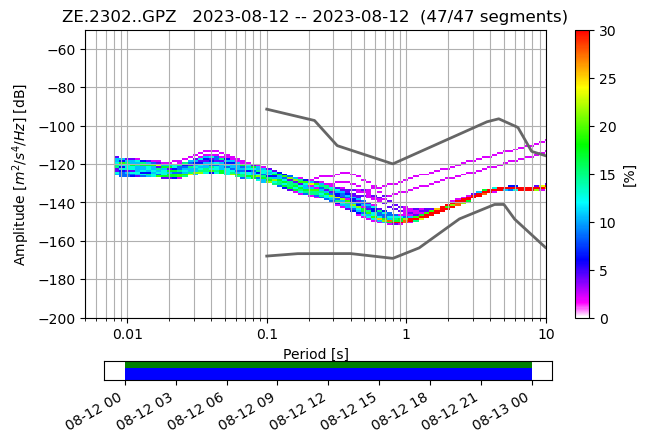

Shape of psd values:  (47, 83)
bins: [0.007, 0.01, 1] s = ~[140, 100, 1] Hz


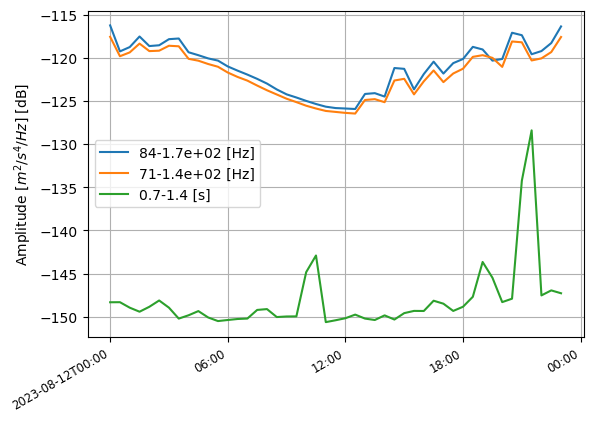


Processing data for 2023-08-13T00:00:00.000000Z to 2023-08-14T00:00:00.000000Z
2023-08-13T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-13T00:00:00.000000Z


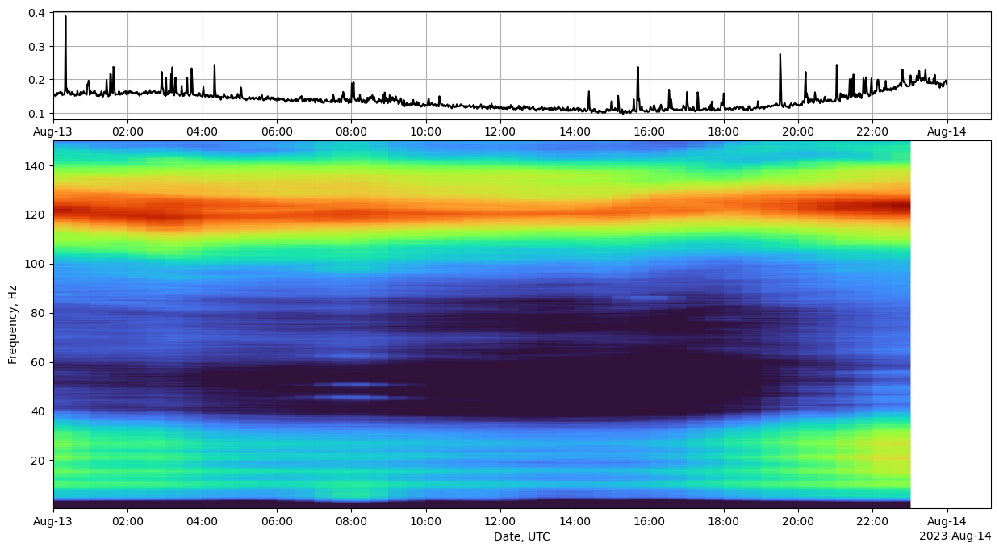

<Figure size 1000x600 with 0 Axes>

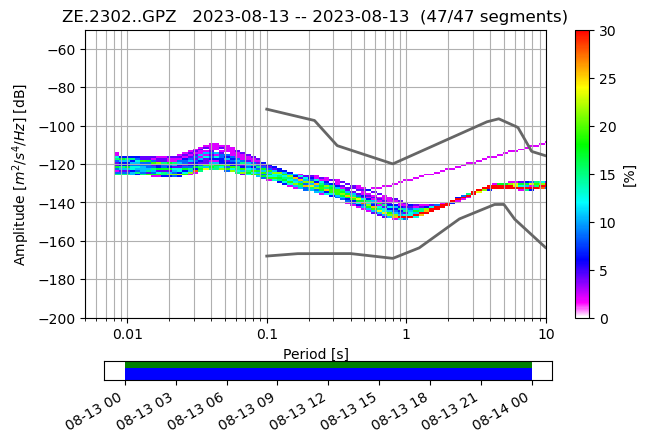

Shape of psd values:  (47, 83)
bins: [0.007, 0.01, 1] s = ~[140, 100, 1] Hz


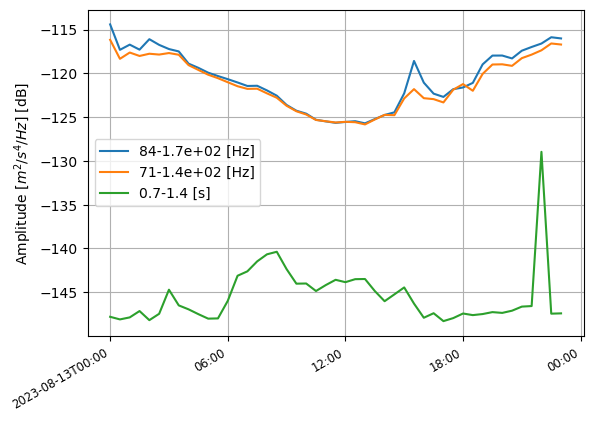


Processing data for 2023-08-14T00:00:00.000000Z to 2023-08-15T00:00:00.000000Z
2023-08-14T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-14T00:00:00.000000Z


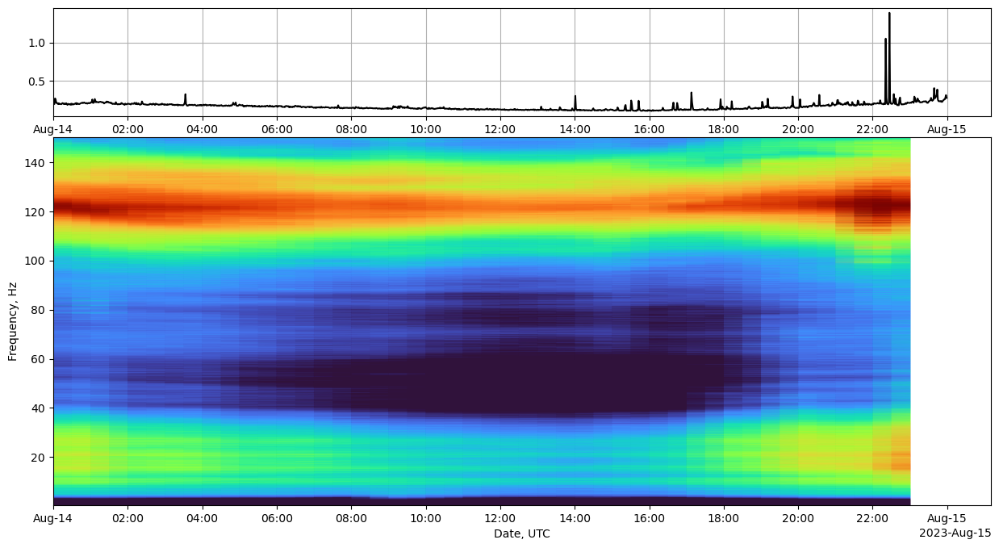

<Figure size 1000x600 with 0 Axes>

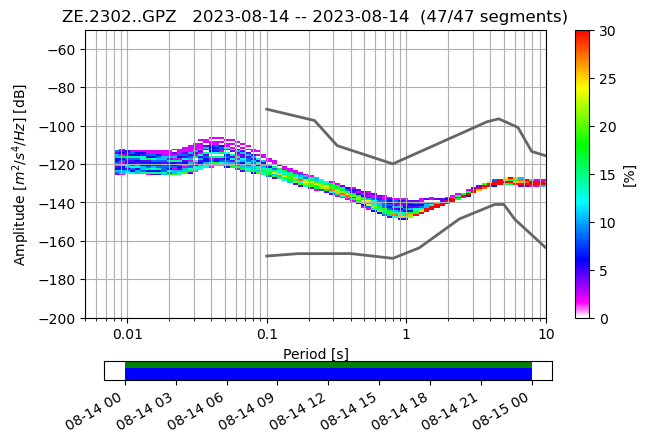

Shape of psd values:  (47, 83)
bins: [0.007, 0.01, 1] s = ~[140, 100, 1] Hz


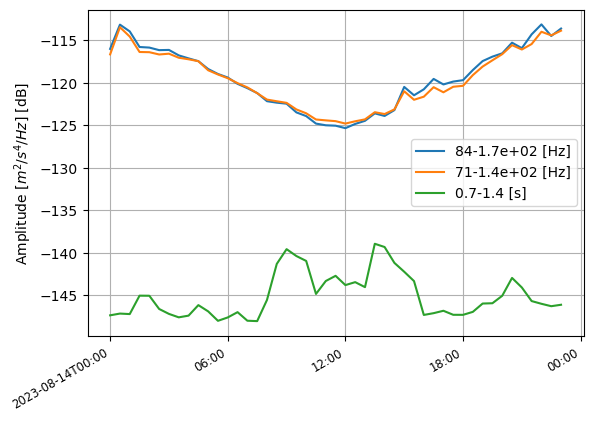


Processing data for 2023-08-15T00:00:00.000000Z to 2023-08-16T00:00:00.000000Z
2023-08-15T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-15T00:00:00.000000Z


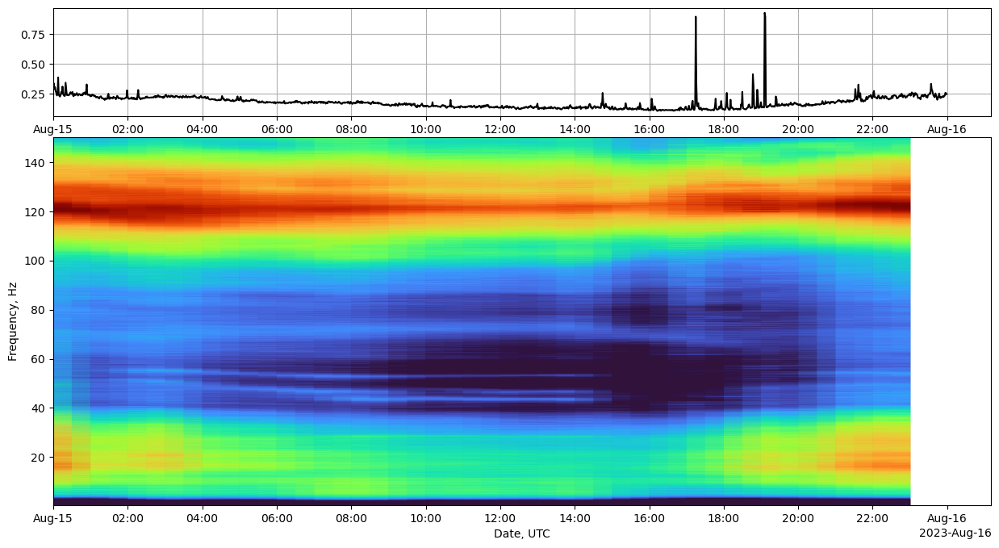

<Figure size 1000x600 with 0 Axes>

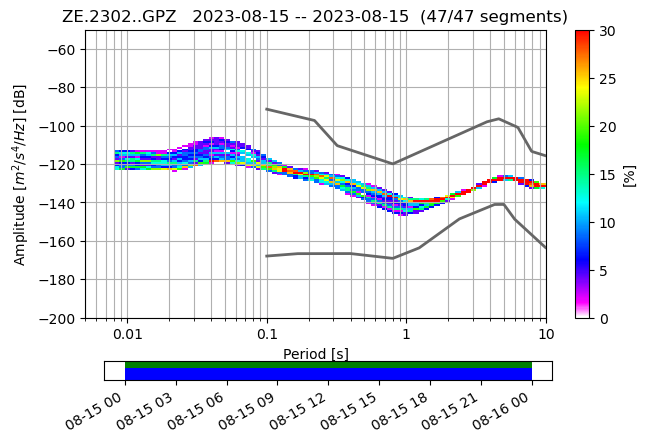

Shape of psd values:  (47, 83)
bins: [0.007, 0.01, 1] s = ~[140, 100, 1] Hz


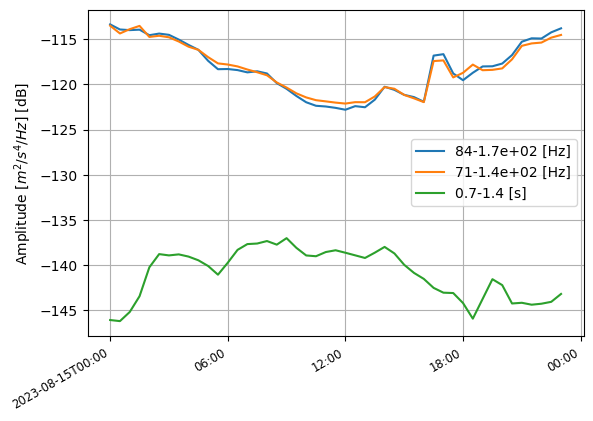


Processing data for 2023-08-16T00:00:00.000000Z to 2023-08-17T00:00:00.000000Z
2023-08-16T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-16T00:00:00.000000Z


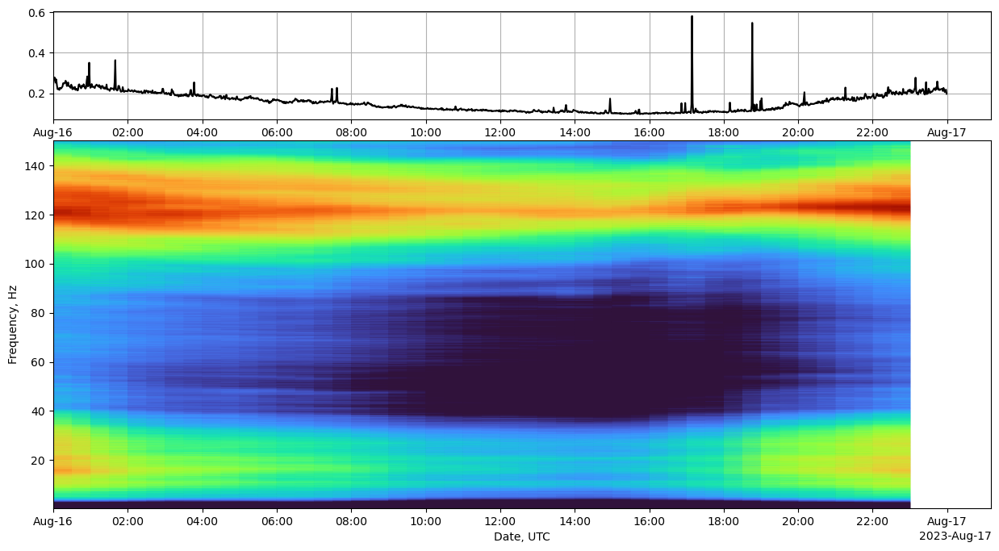

<Figure size 1000x600 with 0 Axes>

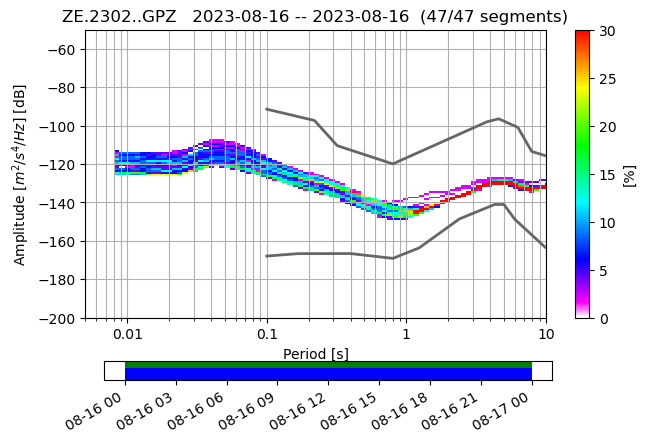

Shape of psd values:  (47, 83)
bins: [0.007, 0.01, 1] s = ~[140, 100, 1] Hz


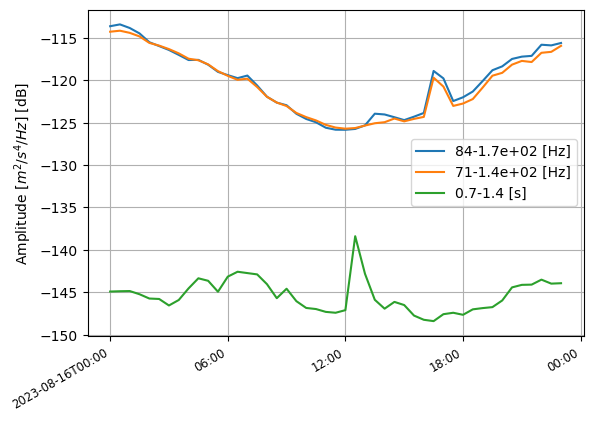

In [3]:
# look at and determine frequency bins
# use temporal plots

# define start and end time for the data range
start_date = UTCDateTime(2023, 8, 12)  # Start time
end_date = UTCDateTime(2023, 8, 17)  # End time
delta = 86400
stas = [2301, 2302, 2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313, 2314, 2315, 2316, 
        'G2301', 'G2302', 'G2303', 'G2304', 'G2305', 'G2306', 'G2307', 'G2308', 'G2309', 'G2310', 'G2311',
        'G2312', 'G2313', 'G2314', 'G2315', 'G2316'] 

# define path where .mseed files are stored
path = 'C:/Users/zzawol/Documents/seismic-data-iris/seismic_data/NO2302/GPZ'
stas = ['ZE.2302..GPZ']  # station IDs
if not os.path.exists(path):
    os.makedirs(path, exist_ok=True)

# set station info
nowsta = stas[0]
network, station, location, channel = nowsta.split('.')
print(f"Station: {nowsta}")

# define the file pattern for reading mseed files
# assuming filenames follow the pattern 'ZE.2304..GPZ_YYYYMMDDTHHMMSS.mseed'
file_pattern = f'{path}/{network}.{station}.*.{channel}*.mseed'

# set up metadata
client = Client("IRISPH5", timeout=600) # timeout (s) - time before connection timeout is raised, default 10s
inv = client.get_stations(network=network, station=station, location=location, channel=channel, level='response')  

# NRL configuration for sensor
sensors = {
    'geophone': 'sensor_DTCC_DT-SOLO_LF5_RC1850_RS43000_SG76.6_STgroundVel'  # SmartSolo sensor configuration
    # Additional sensors can be added to this dictionary as needed
}
# dictionary of EPIC loggers
loggers = {'smartsolo' : 'datalogger_DTCC_SmartSolo-IGU-16HR3C_PD18_FR1000_FPLP_DFOff', # logger for SmartSolo
           # Additional loggers can be added to this dictionary as needed
          } 

# loop through each day in the date range
current_date = start_date
while current_date < end_date:
    t1 = current_date
    t2 = current_date + delta  # the next day
    print(f"\nProcessing data for {t1} to {t2}")

    try: # read data for the current day
        S = obspy.read(file_pattern, starttime=t1, endtime=t2)
        ## RSAM plot before resample?
    except Exception as e:
        print(f"Error reading data for {t1} to {t2}: {e}")
        current_date += delta
        continue  # skip to next date if there's an error reading data

    # merge traces to avoid duplicates
    S.merge(method=1)

    # or plot RSAM after merge, before resample?
    f1 = waveformUtils.multiDaySpectrogram(S, averageLength=3600, fftLength=60, minFreq=0.5, maxFreq=150, cmap='turbo',
                                      dateLimits=None,
                                      vmin=0.4, vmax=0.9, plotAverage=True)
    f1.show()

    #response_z = read_inventory("C:/Users/zzawol/Documents/MORA_winter/xml_files/ph5-station_ZE2303GPZ.xml")  # vertical component xml # creates an ObsPy Inventory object containing response information
    #print("Add filter...")
    #S.filter("highpass", freq=0.002).remove_response(inventory=response_z)

    # # prefiltering for instrument's frequency bandwidth, do before preprocessing
    # for tr in S: # adjust to not read below 0.1 Hz***
    #     pre_filt = [0.1, 1, 100, 150] # values TBD # 4 corner frequencies
    #     tr.remove_response(inventory=inv, pre_filt=pre_filt, plot=True) # , output="DISP", water_level=60, plot=True)  
    
    # resample the data
    print('Resampling...')
    S.resample(175)  # Resampled rate for final analysis. Note: Consider Nyquist criterion
    ## should resample be 2*(max freq of interest) = 2*150 OR 0.5*(initial data save sample rate) = 0.5*350 ?

    # or plot RSAM after resample?
    
    # create PPSD object and add traces
    ppsd = None
    for tr in S:
        if ppsd is None:
            ppsd = PPSD(tr.stats, metadata=inv, period_limits=(0.0057, 10.0)) # ppsd computed for 0.1 to 200 Hz --> should this be 0.0057s (175 Hz) since new resample rate??
        ppsd.add(tr)
        print('Trace added')

    # plot the PPSD for the current day
    if ppsd is not None and len(ppsd.times_processed) > 0:
        print(f"Data accumulated for {(t2-t1)/(60*60*24)}-day periods starting on {t1}")
        #print("Processed times:", ppsd.times_processed[:10])  # see first 10 times processed
        
        # plot the PPSD
        plt.figure(figsize=(10, 6))
        ppsd.plot(period_lim=(0.0057,10),cmap=pqlx) # to zoom into a specific range, adjust period_lim
        psd_values = ppsd.psd_values
        print("Shape of psd values: ", np.shape(psd_values))
        #print(psd_values[0:1]) # first branch

        # add x-axis of PST

        print("bins: [0.007, 0.01, 1] s = ~[140, 100, 1] Hz")
        # plotting time series of PSD values
        ppsd.plot_temporal([0.007,0.01,1])
        # use these values instead:
        #ppsd.plot_temporal([0.00667,0.01,0.1]) # period bins (s)
        
        # save the plot as .png
        #plot_filename = f"ppsd_plot_{t1.date}.png" # change title if more than one date
        #plt.savefig(plot_filename)
        #print(f"Plot saved as {plot_filename}")
        
        plt.close()  # close plot to avoid displaying it in each iteration
        
    else:
        print(f"No data accumulated for {t1} to {t2}, check if exists")

    # move to the next day
    current_date += delta





Station: ZE.2302..GPZ

Processing data for 2023-08-12T00:00:00.000000Z to 2023-08-13T00:00:00.000000Z
2023-08-12T23:00:00.000000Z


C:\Users\zzawol\AppData\Local\Temp\1\ipykernel_18184\2296370684.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  f1.show()


Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-12T00:00:00.000000Z


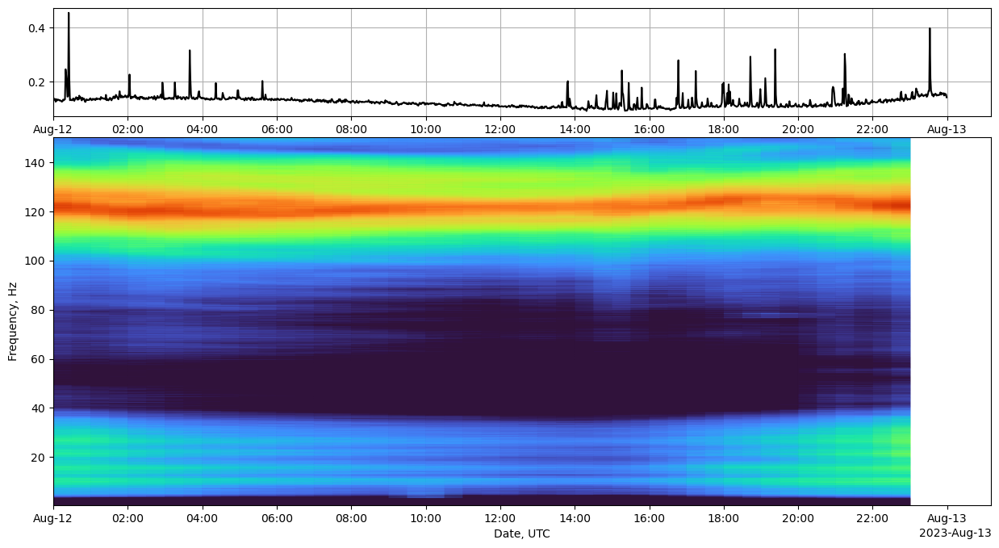

<Figure size 1000x600 with 0 Axes>

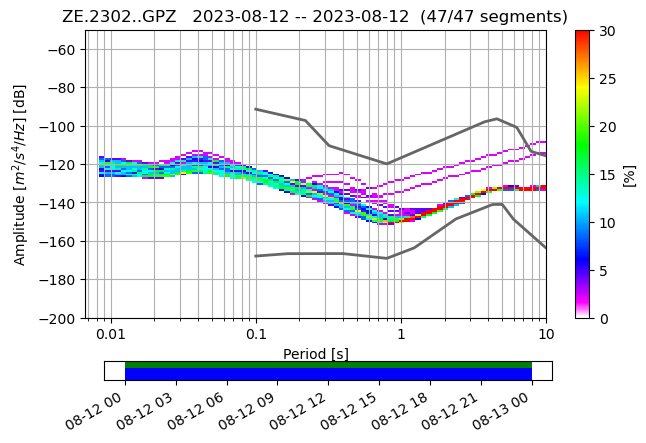

Shape of psd values:  (47, 83)
bins: [0.008333, 0.02, 10] s = [120, 20, 0.1] Hz
bins based on spectrograms


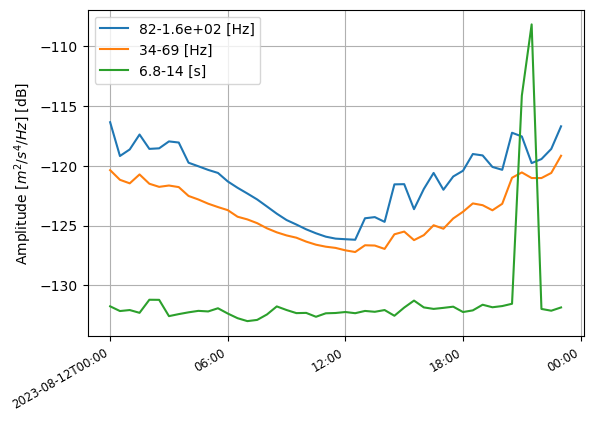


Processing data for 2023-08-13T00:00:00.000000Z to 2023-08-14T00:00:00.000000Z
2023-08-13T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-13T00:00:00.000000Z


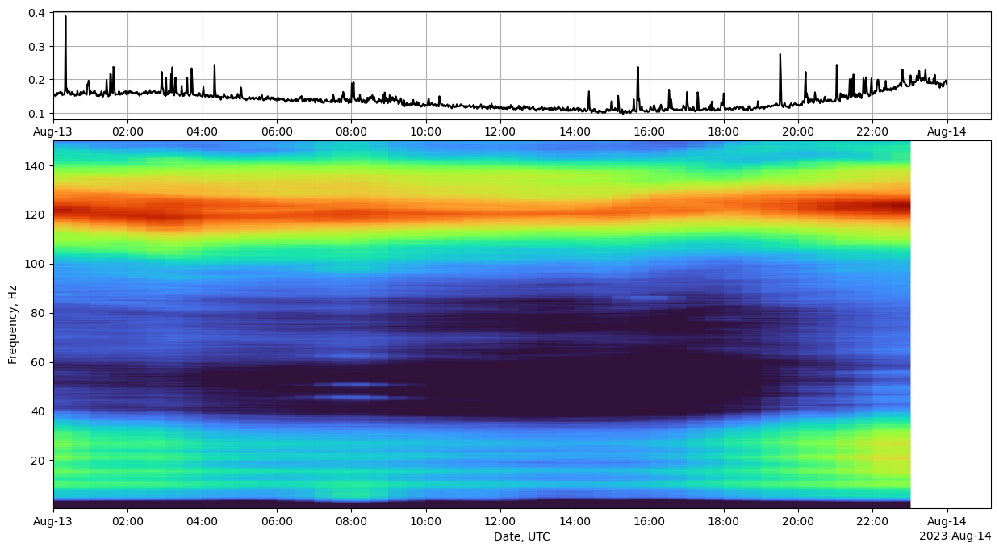

<Figure size 1000x600 with 0 Axes>

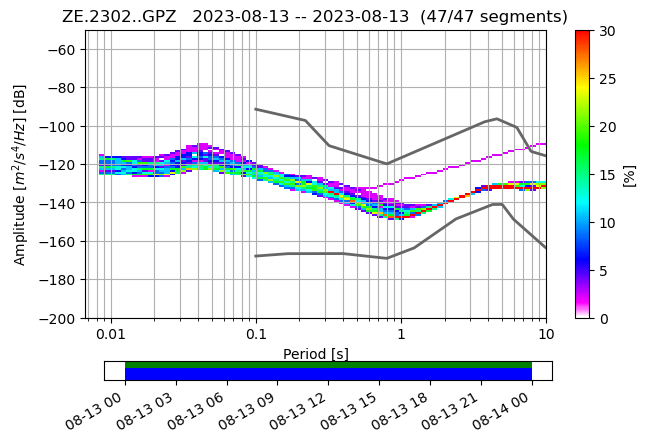

Shape of psd values:  (47, 83)
bins: [0.008333, 0.02, 10] s = [120, 20, 0.1] Hz
bins based on spectrograms


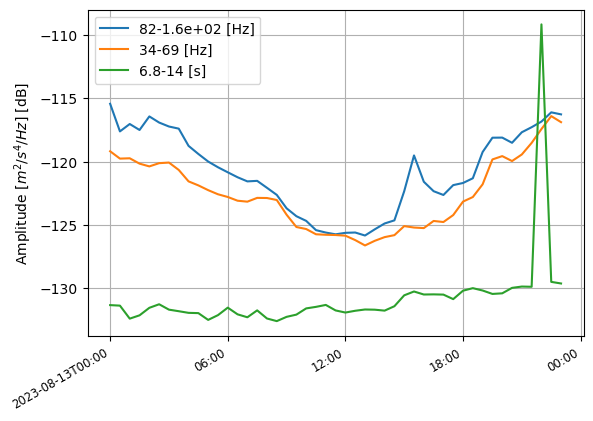


Processing data for 2023-08-14T00:00:00.000000Z to 2023-08-15T00:00:00.000000Z
2023-08-14T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-14T00:00:00.000000Z


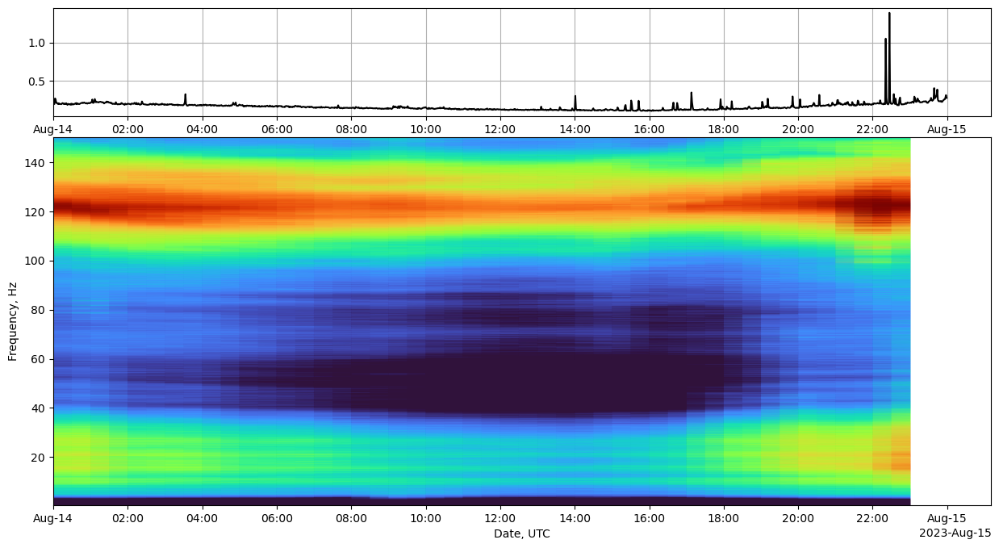

<Figure size 1000x600 with 0 Axes>

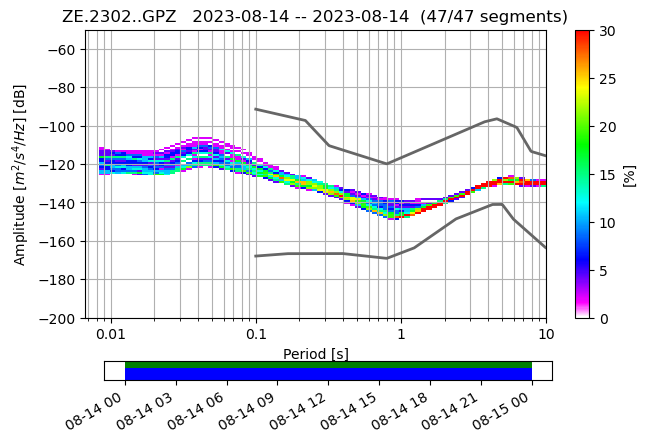

Shape of psd values:  (47, 83)
bins: [0.008333, 0.02, 10] s = [120, 20, 0.1] Hz
bins based on spectrograms


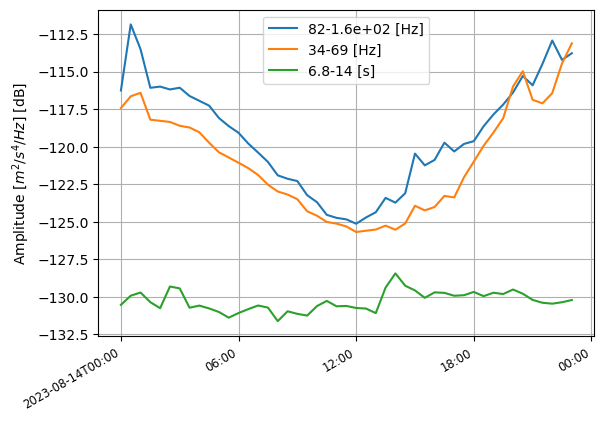


Processing data for 2023-08-15T00:00:00.000000Z to 2023-08-16T00:00:00.000000Z
2023-08-15T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-15T00:00:00.000000Z


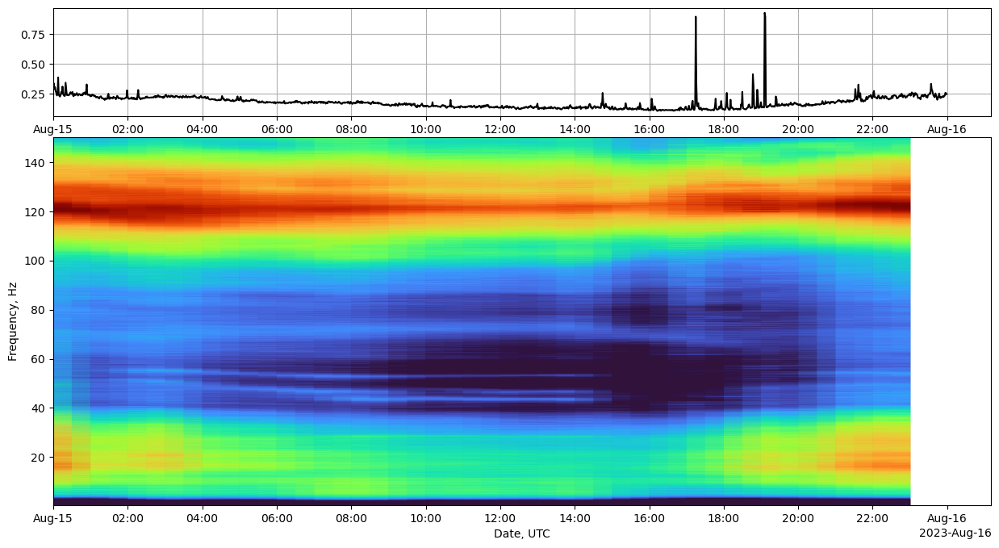

<Figure size 1000x600 with 0 Axes>

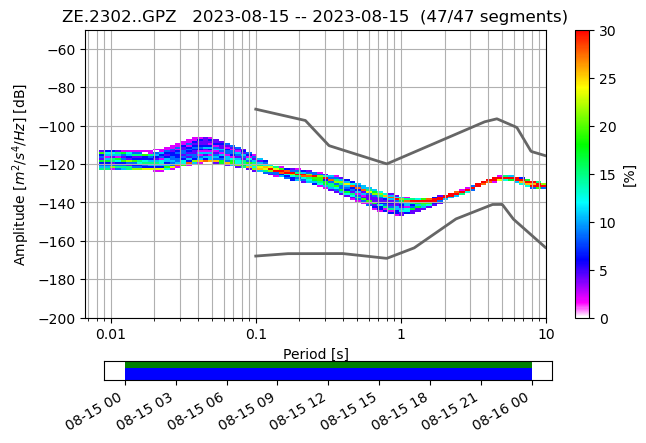

Shape of psd values:  (47, 83)
bins: [0.008333, 0.02, 10] s = [120, 20, 0.1] Hz
bins based on spectrograms


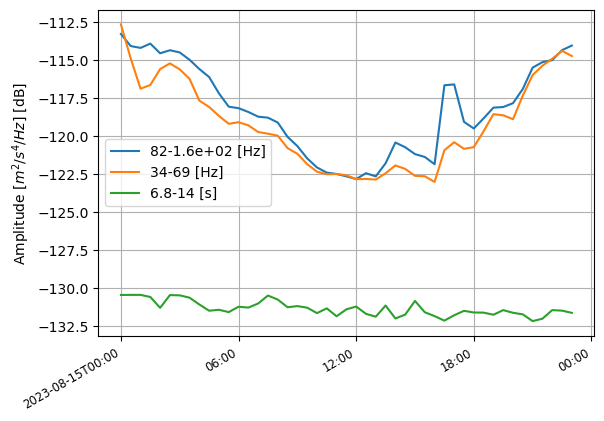


Processing data for 2023-08-16T00:00:00.000000Z to 2023-08-17T00:00:00.000000Z
2023-08-16T23:00:00.000000Z
Resampling...
Trace added
Data accumulated for 1.0-day periods starting on 2023-08-16T00:00:00.000000Z


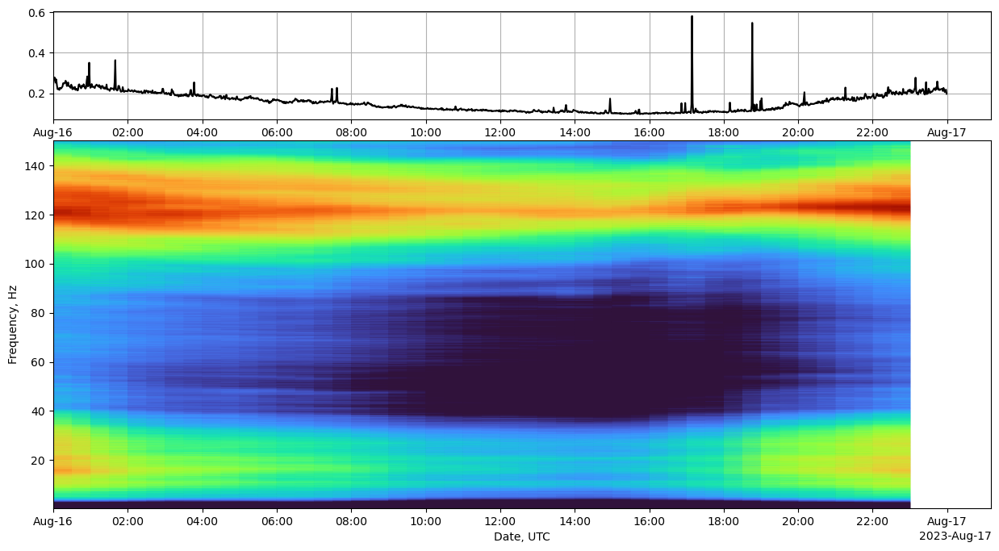

<Figure size 1000x600 with 0 Axes>

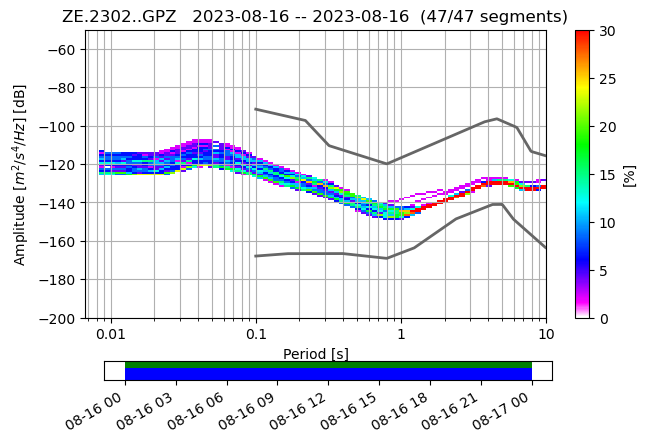

Shape of psd values:  (47, 83)
bins: [0.008333, 0.02, 10] s = [120, 20, 0.1] Hz
bins based on spectrograms


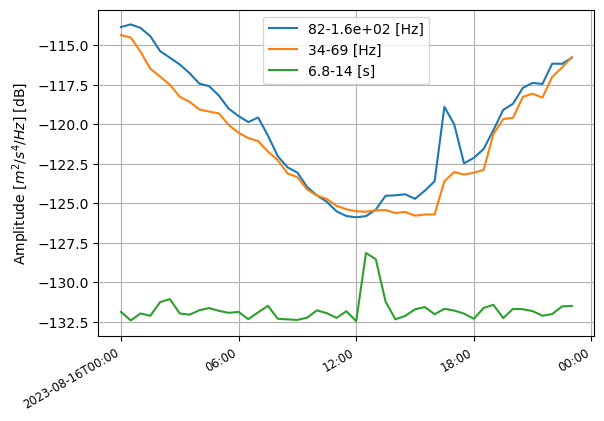

In [4]:
# define start and end time for the data range
start_date = UTCDateTime(2023, 8, 12)  # Start time
end_date = UTCDateTime(2023, 8, 17)  # End time
delta = 86400
stas = [2301, 2302, 2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313, 2314, 2315, 2316, 
        'G2301', 'G2302', 'G2303', 'G2304', 'G2305', 'G2306', 'G2307', 'G2308', 'G2309', 'G2310', 'G2311',
        'G2312', 'G2313', 'G2314', 'G2315', 'G2316'] 

# define path where .mseed files are stored
path = 'C:/Users/zzawol/Documents/seismic-data-iris/seismic_data/NO2302/GPZ'
stas = ['ZE.2302..GPZ']  # station IDs
if not os.path.exists(path):
    os.makedirs(path, exist_ok=True)

# set station info
nowsta = stas[0]
network, station, location, channel = nowsta.split('.')
print(f"Station: {nowsta}")

# define the file pattern for reading mseed files
# assuming filenames follow the pattern 'ZE.2304..GPZ_YYYYMMDDTHHMMSS.mseed'
file_pattern = f'{path}/{network}.{station}.*.{channel}*.mseed'

# set up metadata
client = Client("IRISPH5", timeout=600) # timeout (s) - time before connection timeout is raised, default 10s
inv = client.get_stations(network=network, station=station, location=location, channel=channel, level='response')  

# NRL configuration for sensor
sensors = {
    'geophone': 'sensor_DTCC_DT-SOLO_LF5_RC1850_RS43000_SG76.6_STgroundVel'  # SmartSolo sensor configuration
    # Additional sensors can be added to this dictionary as needed
}
# dictionary of EPIC loggers
loggers = {'smartsolo' : 'datalogger_DTCC_SmartSolo-IGU-16HR3C_PD18_FR1000_FPLP_DFOff', # logger for SmartSolo
           # Additional loggers can be added to this dictionary as needed
          } 

# loop through each day in the date range
current_date = start_date
while current_date < end_date:
    t1 = current_date
    t2 = current_date + delta  # the next day
    print(f"\nProcessing data for {t1} to {t2}")

    try: # read data for the current day
        S = obspy.read(file_pattern, starttime=t1, endtime=t2)
        ## RSAM plot before resample?
    except Exception as e:
        print(f"Error reading data for {t1} to {t2}: {e}")
        current_date += delta
        continue  # skip to next date if there's an error reading data

    # merge traces to avoid duplicates
    S.merge(method=1)

    # or plot RSAM after merge, before resample?
    f1 = waveformUtils.multiDaySpectrogram(S, averageLength=3600, fftLength=60, minFreq=0.5, maxFreq=150, cmap='turbo',
                                      dateLimits=None,
                                      vmin=0.4, vmax=0.9, plotAverage=True)
    f1.show()

    #response_z = read_inventory("C:/Users/zzawol/Documents/MORA_winter/xml_files/ph5-station_ZE2303GPZ.xml")  # vertical component xml # creates an ObsPy Inventory object containing response information
    #print("Add filter...")
    #S.filter("highpass", freq=0.002).remove_response(inventory=response_z)

    # # prefiltering for instrument's frequency bandwidth, do before preprocessing
    # for tr in S: # adjust to not read below 0.1 Hz***
    #     pre_filt = [0.1, 1, 100, 150] # values TBD # 4 corner frequencies
    #     tr.remove_response(inventory=inv, pre_filt=pre_filt, plot=True) # , output="DISP", water_level=60, plot=True)  
    
    # resample the data
    print('Resampling...')
    S.resample(175)  # Resampled rate for final analysis. Note: Consider Nyquist criterion
    ## should resample be 2*(max freq of interest) = 2*150 OR 0.5*(initial data save sample rate) = 0.5*350 ?

    # or plot RSAM after resample?
    
    # create PPSD object and add traces
    ppsd = None
    for tr in S:
        if ppsd is None:
            ppsd = PPSD(tr.stats, metadata=inv, period_limits=(1/150, 10.0)) # ppsd computed for 0.1 to 200 Hz --> should this be 0.0057s (175 Hz) since new resample rate??
        ppsd.add(tr)
        print('Trace added')

    # plot the PPSD for the current day
    if ppsd is not None and len(ppsd.times_processed) > 0:
        print(f"Data accumulated for {(t2-t1)/(60*60*24)}-day periods starting on {t1}")
        #print("Processed times:", ppsd.times_processed[:10])  # see first 10 times processed
        
        # plot the PPSD
        plt.figure(figsize=(10, 6))
        ppsd.plot(period_lim=(1/150,10),cmap=pqlx) # to zoom into a specific range, adjust period_lim
        psd_values = ppsd.psd_values
        print("Shape of psd values: ", np.shape(psd_values))
        #print(psd_values[0:1]) # first branch

        # add x-axis of PST

        print("bins: [0.008333, 0.02, 10] s = [120, 20, 0.1] Hz")
        print("bins based on spectrograms")
        # plotting time series of PSD values
        ppsd.plot_temporal([1/120,0.02,10])
        # use these values instead:
        #ppsd.plot_temporal([0.00667,0.01,0.1]) # period bins (s)
        
        # save the plot as .png
        #plot_filename = f"ppsd_plot_{t1.date}.png" # change title if more than one date
        #plt.savefig(plot_filename)
        #print(f"Plot saved as {plot_filename}")
        
        plt.close()  # close plot to avoid displaying it in each iteration
        
    else:
        print(f"No data accumulated for {t1} to {t2}, check if exists")

    # move to the next day
    current_date += delta

In [ ]:
#Working from documentation for Visualizing Probabalistic Power Spectra Densities in the OBSPY 1.4.1 user guide.
#Objective is to determine a strategy for assessing signal quality between different sites and times.
#Signals validated by whatever tool can be produced here are intended to be of enough quality to carry forward for figures and additional analysis

#st = read("https://examples.obspy.org/BW.KW1..EHZ.D.2011.037")
#tr = st.select(id="BW.KW1..EHZ")[0]

import obspy
from obspy import read, UTCDateTime
from obspy.io.xseed import Parser
from obspy.signal import PPSD
import numpy as np
import matplotlib.pyplot as plt
from obspy.imaging.cm import pqlx
import os
from obspy.clients.fdsn import Client
from datetime import timedelta

## example with ZE 2303 GPZ 7/13 - 7/16
## whole date range 2023-07-12 to 2023-09-08
# but exclude first and last day for cleaner data

# define start and end time for the data range
start_date = UTCDateTime(2023, 7, 13)  # Start time
end_date = UTCDateTime(2023, 7, 16)  # End time
delta = timedelta(days=1)  # define time interval between each iteration (1 day), can just use seconds instead

# define path where .mseed files are stored
path = 'C:/Users/zzawol/Documents/seismic-data-iris/seismic_data/NO2303'
stas = ['ZE.2303..GPZ']  # station IDs
if not os.path.exists(path):
    os.makedirs(path, exist_ok=True)

# set station info
nowsta = stas[0]
network, station, location, channel = nowsta.split('.')
print(f"Station: {nowsta}")

# define the file pattern for reading mseed files
# assuming filenames follow the pattern 'ZE.2304..GPZ_YYYYMMDDTHHMMSS.mseed'
file_pattern = f'{path}/{network}.{station}.*.{channel}*.mseed'

# set up metadata
client = Client("IRISPH5", timeout=600) # timeout (s) - time before connection timeout is raised, default 10s
inv = client.get_stations(network=network, station=station, location=location, channel=channel, level='response')  

# loop through each day in the date range
current_date = start_date
while current_date < end_date:
    t1 = current_date
    t2 = current_date + delta  # The next day
    print(f"\nProcessing data for {t1} to {t2}")

    try: # read data for the current day
        S = obspy.read(file_pattern, starttime=t1, endtime=t2)
    except Exception as e:
        print(f"Error reading data for {t1} to {t2}: {e}")
        current_date += delta
        continue  # skip to next date if there's an error reading data

    # merge traces to avoid duplicates
    S.merge(method=1)

    # # prefiltering for instrument's frequency bandwidth, do before preprocessing
    # for tr in S:
    #     pre_filt = [0.01, 1, 100, 150] # values TBD # 4 corner frequencies
    #     tr.remove_response(inventory=inv, pre_filt=pre_filt, plot=True) # , output="DISP", water_level=60, plot=True)  
    
    # resample the data
    print('Resampling...')
    S.resample(100)  # Resampled rate for final analysis. Note: Consider Nyquist criterion

    # create PPSD object and add traces
    ppsd = None
    for tr in S:
        if ppsd is None:
            ppsd = PPSD(tr.stats, metadata=inv, period_limits=(0.01, 10.0))
        ppsd.add(tr)
        print('Trace added')

    # plot the PPSD for the current day
    if ppsd is not None and len(ppsd.times_processed) > 0:
        print(f"Data accumulated for {(t2-t1)/(60*60*24)}-day periods starting on {t1}")
        print("Processed times:", ppsd.times_processed[:10])  # see first 10 times processed
        
        # plot the PPSD
        plt.figure(figsize=(10, 6))
        ppsd.plot(cmap=pqlx)
        psd_values = ppsd.psd_values
        print("Shape of psd values: ", np.shape(psd_values))
        #print(psd_values[0:1]) # first branch
        
        # plotting time series of PSD values
        ppsd.plot_temporal([0.1,1,10])
        
        # save the plot as .png
        #plot_filename = f"ppsd_plot_{t1.date}.png" # change title if more than one date
        #plt.savefig(plot_filename)
        #print(f"Plot saved as {plot_filename}")
        
        plt.close()  # close plot to avoid displaying it in each iteration
        
    else:
        print(f"No data accumulated for {t1} to {t2}, check if exists")

    # move to the next day
    current_date += delta